# **Image processing: Exploring geometric, logical and morphological operations in images + Color spaces (Part I)**  

**This lab is composed of two parts.**

**You must submit a single lab report covering both Part I and Part II.**

**Part II will be sent before the start of next week's session.**

**The lab report is due by the end of the second lab session.**

In this lab, you will explore essential image processing techniques that transform and enhance images, allowing you to extract meaningful insights. These foundational operations serve as building blocks for more advanced computer vision applications.  

### **What you will learn in this Lab:**  
- You will understand the principles behind **geometric transformations and logical operations** in image processing.  
- You will apply **geometric transformations** such as **resizing, rotation, translation, and perspective modification** to adjust image properties.  
- You will perform **bitwise logical operations** to manipulate and combine images.  
- Learn about **morphological operations** to enhance and extract structural information from images.  
- Explore **color spaces** and how to convert between different color models for advanced image processing.  

---  




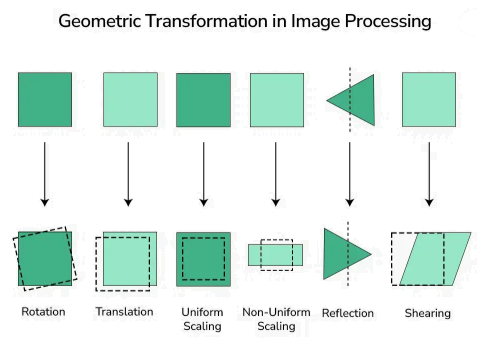
-----

### Understanding the libraries used
Before starting the lab, provide a brief definition of the following libraries and their role in image processing:

- **OpenCV**: Open Source Computer Vision Library, primarily used for image and video processing tasks such as geometric transformations, filtering, and morphological operations.
  
- **NumPy**: A fundamental package for numerical computing in Python, providing support for arrays, matrices, and mathematical functions used in image processing.
  
- **Matplotlib**: A plotting library for Python that enables visualization of images, histograms, and transformations applied to images.

If not installed, you can install them using:

`pip install opencv-python numpy matplotlib`

In [1]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

# Manipulation 1: Geometric Transformations  

You will explore **geometric transformations** and their role in image processing, including:  

- **Resizing (Scaling)** – Adjusting the image dimensions while preserving or modifying aspect ratios.  
- **Translation** – Moving an image to a different position without altering its content.  
- **Rotation** – Changing the orientation of an image around a fixed point.  
- **Shearing** – Slanting the image along an axis, distorting its shape.  
- **Perspective Transformation** – Adjusting the image’s perspective to simulate different viewpoints.  



### Why are these transformations important?  

They are widely used in various computer vision tasks, such as:  

- **Image alignment** – Aligning images for analysis and comparison.  
- **Data augmentation** – Creating variations of images for training machine learning models.  
- **Perspective correction** – Fixing distortions in images for better representation and analysis.  

### **Key Concepts in Image Processing**  

- **Geometrical Transformations:** Modify an image’s shape, size, or orientation. Includes **scaling, rotation, translation, and perspective transformation** to adjust image properties.  


- **Logical Operations:** Use **bitwise operations** (AND, OR, XOR, NOT) to combine or manipulate images at the pixel level. Useful for **masking, segmentation, and blending images**.  


- **Morphological Operations:** Apply shape-based processing on binary images using techniques like **dilation, erosion, opening, and closing** to remove noise, extract features, or enhance structures. Common in **edge detection and object recognition**.




## Task 1: Image scaling  

#### **T 1.1: Resizing algorithms**  

Explore and compare different image resizing methods. For each method, provide a description of how it works:  

- **Nearest Neighbor:** The simplest method, assigns the value of the closest pixel to the new pixel. **Fast but can cause pixelation**, especially when enlarging an image.  

- **Bilinear Interpolation:** Computes the new pixel value as a **weighted average of the 4 nearest pixels**. **Produces smoother results** but can introduce slight blurring.  

- **Bicubic Interpolation:** Uses **16 surrounding pixels** and applies a cubic function for interpolation. **Gives higher-quality, sharper results**, but is **more computationally expensive** than bilinear.  


---

**Manual implementation of a resizing algorithm:** Write a function that implements the nearest neighbor resizing algorithm manually, without using any built-in functions for resizing. The new size can be provided as absolute values and also as positive/negative ratios.

- Load the `cameraman.png` image. 
- Resize the `cameraman.png` image both up and down using the nearest neighbor method you have implemented. Perform at leat 6 differents resizings.
- Display the original image along with its size.  
- Display the resized images with their new sizes.  

**Hint:** You can achieve this by iterating over the pixel values and mapping them to a new zero matrix (black image) with the desired size based on the chosen interpolation method. It is important to warn the user if the new size of the image does not preserve the aspect ratio (but the resize has to be performed anyway).

**Perform the same work for another resizing method: Bilinear interpolation or Bicubic interpolation.**

**Analyse the obtained images.**


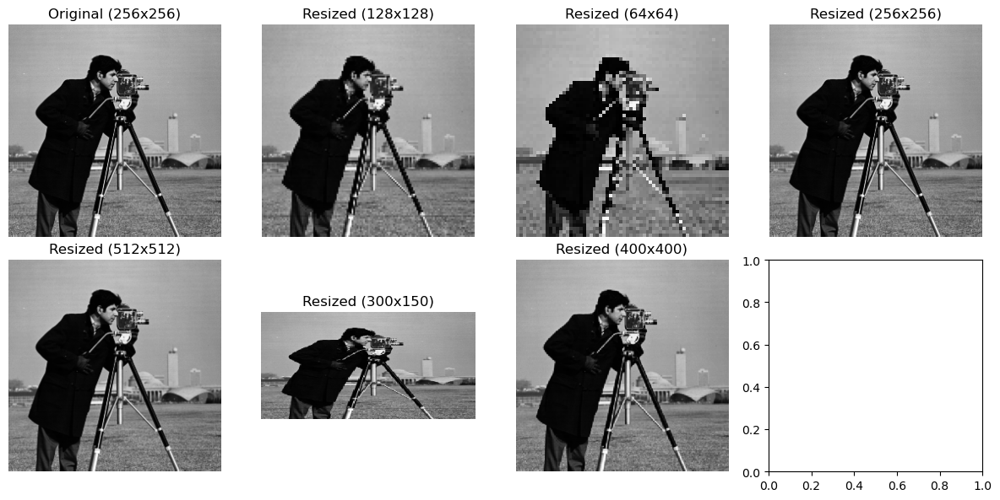

In [2]:
# Your code here.
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image_path = "images/cameraman.png"
original_image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

# Function to perform nearest neighbor interpolation manually
def nearest_neighbor_resize(image, new_width, new_height):
    original_height, original_width = image.shape
    resized_image = np.zeros((new_height, new_width), dtype=image.dtype)

    for i in range(new_height):
        for j in range(new_width):
            orig_x = int(j * original_width / new_width)
            orig_y = int(i * original_height / new_height)
            resized_image[i, j] = image[orig_y, orig_x]

    return resized_image

resizing_params = [
    (128, 128),   # Half-size
    (64, 64),     # Quarter-size
    (256, 256),   # Original size
    (512, 512),   # Double-size
    (300, 150),   # Aspect ratio change (warning expected)
    (400, 400)    # Square upscaling
]

# Perform resizing using nearest neighbor
resized_images = [nearest_neighbor_resize(original_image, w, h) for w, h in resizing_params]

# Display the original and resized images
fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.ravel()

# Show original image
axes[0].imshow(original_image, cmap='gray')
axes[0].set_title(f"Original ({original_image.shape[1]}x{original_image.shape[0]})")
axes[0].axis('off')

# Show resized images
for i, (resized, (w, h)) in enumerate(zip(resized_images, resizing_params), start=1):
    axes[i].imshow(resized, cmap='gray')
    axes[i].set_title(f"Resized ({w}x{h})")
    axes[i].axis('off')

plt.tight_layout()
plt.show()


### Analysis of Resized Images
- Original (256x256): Clear and sharp.
- 128x128: Slight detail loss but still recognizable.
- 64x64: Noticeable pixelation and blocky appearance.
- 256x256: Identical to the original, confirming correct resizing.
- 512x512: Enlarged but more pixelated due to nearest-neighbor interpolation.
- 300x150: Aspect ratio distortion (compressed vertically).
- 400x400: Enlarged with visible artifacts but retains general structure.

#### **T 1.2: Image resizing using built-in functions of OpenCV**  

The `resize()` function in OpenCV allows adjusting the size of an image in different ways:  

- Scaling using axis-specific factors:  
   - `fx`: Scale factor along the **horizontal axis**.  
   - `fy`: Scale factor along the **vertical axis**.  

- Interpolation parameter (`interpolation`)  
   - Determines how pixel values are calculated when resizing.  
   - Common interpolation methods:  
     - `cv2.INTER_NEAREST`
     - `cv2.INTER_LINEAR`
     - `cv2.INTER_CUBIC`  

---

Before applying the `resize()` function, youl will first create a simple grayscale test image using `NumPy` and `Matplotlib`. The image will be **6×6 pixels** and structured as follows:  

- The background is black *(pixel value = 0)*.  
- A white square *(pixel value = 255)* fills the inner **4×4** region, starting from **row 1 and column 1**.  
- A smaller black square *(pixel value = 0)* is embedded inside the white square, occupying the **central 2×2** region.  

Once the image (`imgtest`) is created, it should be displayed before applying any resizing operations.  

After generating the test image, the next step is to apply the `resize()` function to modify its dimensions. This involves adjusting the scale factors along the horizontal (`fx`) and vertical (`fy`) axes and experimenting with different interpolation methods.  

To do this, follow these steps:  
1. Use `resize()` to scale `imgtest` by modifying the `fx` and `fy` values.  
2. Apply different interpolation methods (`INTER_NEAREST`, `INTER_LINEAR`, `INTER_CUBIC`) and observe their effects.  
3. Display both the original and resized versions of `imgtest` and analyze the differences.  


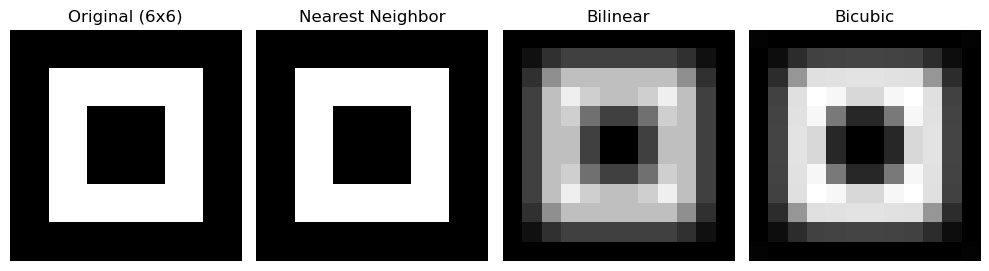

In [3]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Create a simple 6x6 grayscale test image
imgtest = np.zeros((6, 6), dtype=np.uint8)  # Black background (0)

# White square in the inner 4x4 region
imgtest[1:5, 1:5] = 255  

# Small black square (2x2) in the center of the white square
imgtest[2:4, 2:4] = 0  

# Step 2: Apply resizing with different scale factors and interpolation methods
resized_nearest = cv.resize(imgtest, (12, 12), interpolation=cv.INTER_NEAREST)
resized_linear = cv.resize(imgtest, (12, 12), interpolation=cv.INTER_LINEAR)
resized_cubic = cv.resize(imgtest, (12, 12), interpolation=cv.INTER_CUBIC)

# Step 3: Display original and resized images
fig, axes = plt.subplots(1, 4, figsize=(10, 5))
titles = ["Original (6x6)", "Nearest Neighbor", "Bilinear", "Bicubic"]
images = [imgtest, resized_nearest, resized_linear, resized_cubic]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray', vmin=0, vmax=255)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


After experimenting with the test image, you will now apply the `resize()` function to a **real-world image**, `cameraman.png`. This will allow you to observe how resizing affects a more complex image compared to the simple structured pattern of `imgtest`.  

To analyze the effects of resizing, follow these steps:  

1. Resize `cameraman.png` by adjusting `fx` and `fy` values to scale the image both up and down.  
2. Apply a scaling factor between `0` and `1` to shrink the image while maintaining aspect ratio.  
3. Resize the image by specifying exact dimensions (`rows = 250`, `cols = 400`) instead of using scale factors.  
4. Compare the resized outputs with those from `imgtest` and discuss how interpolation affects a natural image differently from a synthetic one.  


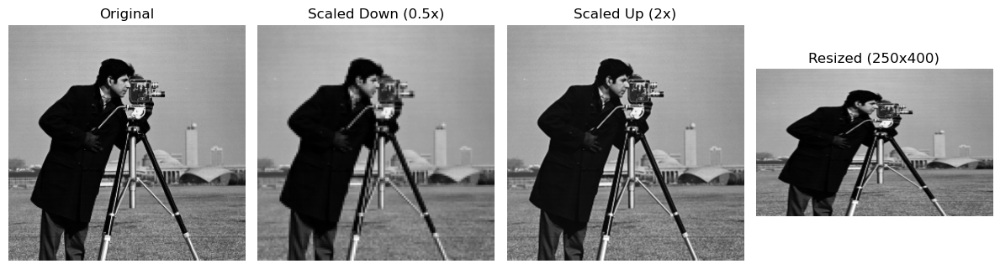

In [4]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

cameraman = cv.imread(image_path, cv.IMREAD_GRAYSCALE)


# Step 1: Resize using scale factors (shrinking while maintaining aspect ratio)
scaled_down = cv.resize(cameraman, None, fx=0.5, fy=0.5, interpolation=cv.INTER_LINEAR)

# Step 2: Resize using scale factors (enlarging while maintaining aspect ratio)
scaled_up = cv.resize(cameraman, None, fx=2.0, fy=2.0, interpolation=cv.INTER_CUBIC)

# Step 3: Resize to specific dimensions (250x400)
resized_exact = cv.resize(cameraman, (400, 250), interpolation=cv.INTER_LINEAR)

# Step 4: Display original and resized images
fig, axes = plt.subplots(1, 4, figsize=(12, 6))
titles = ["Original", "Scaled Down (0.5x)", "Scaled Up (2x)", "Resized (250x400)"]
images = [cameraman, scaled_down, scaled_up, resized_exact]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()



### Questions:
After applying the `resize()` function to both `imgtest` and `cameraman.png`, analyze the results by answering the following questions:  

1. How does resizing a structured test image (`imgtest`) compare to resizing a real-world image (`cameraman.png`)?  
2. What differences do you observe when using different interpolation methods?  
3. How does resizing with a scaling factor (`fx`, `fy`) differ from specifying exact dimensions (`rows`, `cols`)?  
4. Which method produces the best visual quality for **upscaling** and which one for **downscaling**? Explain why.
5. Analyse this transformation considering the aspect ratio.
6. Analyze and compare the obtained resized images with those obtained using the function you implementd in **T1.1**.

---

***Add your analysis and comments here***  

### **Answers to the Questions**  

1. **Resizing `imgtest` vs. `cameraman.png`**  
   - **`imgtest` (structured):** Sharp edges become blurred with bilinear/bicubic interpolation. Nearest neighbor retains the blocky structure.  
   - **`cameraman.png` (real-world):** Bilinear/bicubic interpolation smooths textures, preserving details better than nearest neighbor.  
   

2. **Differences in Interpolation Methods**  
   - **Nearest Neighbor:** Pixelated, blocky results (useful for sharp structures).  
   - **Bilinear:** Softens edges, reducing pixelation.  
   - **Bicubic:** Even smoother results but may introduce slight artifacts.  
   

3. **Scaling Factor (`fx`, `fy`) vs. Exact Dimensions (`rows`, `cols`)**  
   - **Scaling Factor:** Maintains aspect ratio automatically.  
   - **Exact Dimensions:** Can distort the image if the aspect ratio is not preserved.  
   

4. **Best Methods for Upscaling & Downscaling**  
   - **Upscaling:** **Bicubic** produces the best smoothness and detail retention.  
   - **Downscaling:** **Bilinear** works best to avoid aliasing, while bicubic helps preserve details.  


5. **Aspect Ratio Considerations**  
   - If aspect ratio is **not preserved**, the image appears stretched or squished.  
   - Scaling with **equal `fx` and `fy`** prevents distortion.  


6. **Comparison with Manual Nearest Neighbor (T1.1)**  
   - **Manual Nearest Neighbor (T1.1):** Pixelation in upscaling, loss of details in downscaling.  
   - **OpenCV Methods:** More flexibility, **better quality with bilinear/bicubic** compared to manual resizing. 
   

**Conclusion:** OpenCV’s interpolation methods provide superior results compared to manual nearest neighbor, especially for real-world images!




## Task 2: Image translation  

Geometric transformations involve mathematical operations that modify the coordinates of the image's pixels. These transformations are typically represented using transformation matrices that define how each point in the image is repositioned.  

#### **Understanding translation**  

Translation refers to shifting an image by a specified number of pixels along the **x-axis** and **y-axis**. This operation moves every pixel in the image without altering its shape, size or orientation.  

Mathematically, translation is represented as follows:  

$$
\begin{bmatrix}
x' \\ y'
\end{bmatrix}
=
\begin{bmatrix}
x + \Delta x \\ y + \Delta y
\end{bmatrix}
$$  

where:  

- \( $x'$ \) and \( $y'$ \) are the new coordinates after translation.  
- \( $x$ \) and \( $y$ \) are the original coordinates of the pixel.  
- \( $\Delta x$ \) and \( $\Delta y$ \) are the translation offsets along the horizontal and vertical axes, respectively.  

Translation is often used for **image alignment, object tracking, and perspective adjustments** in computer vision tasks.  


-------
**Exampel of translation**

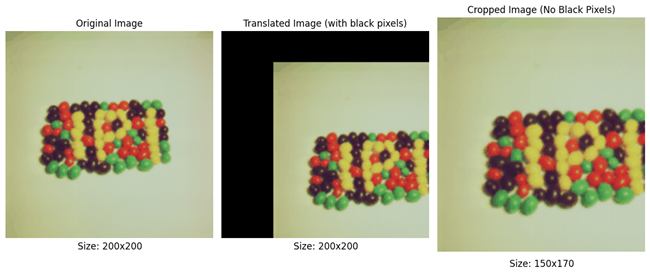


In this task, you will apply **image translation** using OpenCV's `warpAffine()` function to shift an image in different directions.  

### **Instructions:**  
1. Select an image from the given `images` folder to perform the translation.  
2. Translate the image by shifting:  
   - 100 pixels horizontally (along the x-axis).  
   - 200 pixels vertically (along the y-axis).  
   - Both axes simultaneously (100 pixels right and 200 pixels down).  
3. Remove the black pixels that appear after translation.  
4. Use the function `warpAffine()` from the `cv2` module to apply the transformation.  
5. Analyze the results by observing how translation affects the image and discussing potential use cases.  


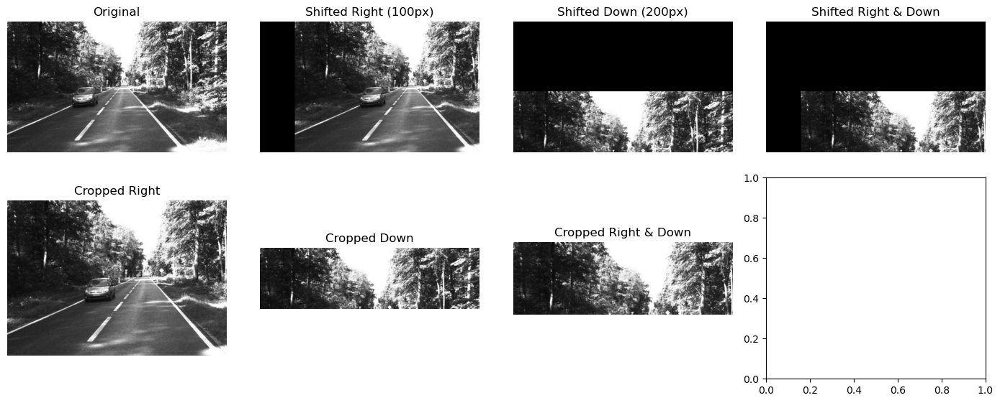

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load an image from the given folder
image_path = "images/road.png"
image = cv.imread(image_path, cv.IMREAD_GRAYSCALE)


# Get image dimensions
height, width = image.shape

# Define translation matrices
M_x = np.float32([[1, 0, 100], [0, 1, 0]])    # 100 pixels right
M_y = np.float32([[1, 0, 0], [0, 1, 200]])    # 200 pixels down
M_xy = np.float32([[1, 0, 100], [0, 1, 200]]) # 100 right, 200 down

# Apply the translation using warpAffine
translated_x = cv.warpAffine(image, M_x, (width, height))
translated_y = cv.warpAffine(image, M_y, (width, height))
translated_xy = cv.warpAffine(image, M_xy, (width, height))

# Crop to remove black regions
cropped_x = translated_x[:, 100:]  # Remove black pixels on the left
cropped_y = translated_y[200:, :]  # Remove black pixels on top
cropped_xy = translated_xy[200:, 100:]  # Remove black pixels on both left & top

# Display results
fig, axes = plt.subplots(2, 4, figsize=(14, 6))
axes = axes.ravel()
titles = ["Original", "Shifted Right (100px)", "Shifted Down (200px)", "Shifted Right & Down"]
images = [image, translated_x, translated_y, translated_xy]
cropped_titles = ["Cropped Right", "Cropped Down", "Cropped Right & Down"]
cropped_images = [cropped_x, cropped_y, cropped_xy]

# Show original and translated images
for i, (ax, img, title) in enumerate(zip(axes[:4], images, titles)):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

# Show cropped images
for i, (ax, img, title) in enumerate(zip(axes[4:], cropped_images, cropped_titles)):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()





***Add your analysis and comments here***  

### **Answers to the Questions**  

1. **How does translating the image affect its appearance?**  
   - The image shifts in the specified direction, leaving empty (black) regions where the original pixels moved out.  

2. **What happens to the pixels that are shifted beyond the image boundaries?**  
   - They are lost and cannot be recovered unless the transformation is reversed.  

3. **Why do black pixels appear after translation, and how can they be removed effectively?**  
   - Black pixels represent empty areas where no original data exists.  
   - They can be removed by cropping the image to exclude the black regions or by filling them with background color.  

4. **Comparison: Single-axis vs. Both-axis Translation**  
   - **Single-axis translation (`x` or `y`)** results in black regions on one side.  
   - **Both-axis translation (`x` and `y`)** creates black areas on multiple sides, reducing the visible part of the image further.  




#### **Challenge 1: Translating an Object**  

In this challenge, you will apply translation to animate the movement of an object inside an image.  

**Use `Circle.png` as the input image**.


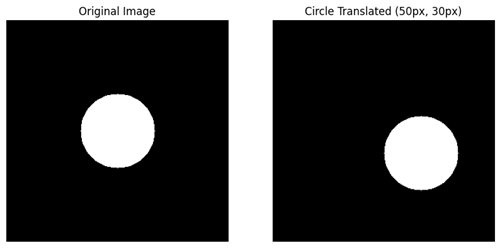

In [6]:
import cv2 as cv
import numpy as np

# Load the 'Circle.png' image
image_path = "images/Circle.png"
image = cv.imread(image_path, cv.IMREAD_UNCHANGED)


# Get image dimensions
height, width = image.shape[:2]

# Create a window for displaying animation
cv.namedWindow("Animation", cv.WINDOW_AUTOSIZE)

# Define translation steps
num_steps = 20  # Number of animation steps
step_size = 5   # Pixels per step

for i in range(num_steps):
    tx = i * step_size  # Move right by step_size pixels per frame
    ty = 0  # No vertical movement

    # Define translation matrix
    M = np.float32([[1, 0, tx], [0, 1, ty]])

    # Apply translation
    translated = cv.warpAffine(image, M, (width, height))

    # Show animation frame
    cv.imshow("Animation", translated)
    cv.waitKey(100)  # Delay (in milliseconds) to control animation speed

# Close the window after animation
cv.destroyAllWindows()


#### **Challenge 2: Dynamic Object Translation**  
1. Perform horizontal translation → Shift the white circle continuously to the right. Once it reaches the image boundary, it should reappear from the left side.  
2. Perform vertical translation → Shift the circle downward, ensuring it wraps around and reappears from the top.  
3. Apply sinewave-based horizontal translation → Make the circle follow a sinusoidal path as it moves horizontally.  
4. Generate an animation to visualize the movement over time.  



To create a video file, you first need to initialize a **`VideoWriter`** object.  


- Step 1: Define the codec (video format)

  `fourcc = cv2.VideoWriter_fourcc(*'mp4v')`

- Step 2: Create the video writer

  `video_writer = cv2.VideoWriter('your/saving/path/output_video.mp4', fourcc, 30, (image_width, image_height))`

- Step 3: Write frames (each frame corresponds to one translation step) to the video inside a loop

  `video_writer.write(frame)`

- Step 4: Release the video writer (finalize the video file once the loop ends)

  `video_writer.release()`

In [13]:
import cv2 as cv
import numpy as np
import math

# Define image size and properties
height, width = 200, 200
circle_radius = 30
circle_color = (255, 255, 255)  # White

# Initialize video writers for each task
fourcc = cv.VideoWriter_fourcc(*'mp4v')

video_horiz = cv.VideoWriter("circle_horizontal.mp4", fourcc, 30, (width, height))
video_vert = cv.VideoWriter("circle_vertical.mp4", fourcc, 30, (width, height))
video_sine = cv.VideoWriter("circle_sine.mp4", fourcc, 30, (width, height))

# Number of frames
num_frames = 100

# Animation loop
for i in range(num_frames):
    # Create blank frames for each motion type
    frame_horiz = np.zeros((height, width, 3), dtype=np.uint8)
    frame_vert = np.zeros((height, width, 3), dtype=np.uint8)
    frame_sine = np.zeros((height, width, 3), dtype=np.uint8)

    # Horizontal translation (wrap-around)
    tx = (i * 5) % width
    cv.circle(frame_horiz, (tx, height // 2), circle_radius, circle_color, -1)

    # Vertical translation (wrap-around)
    ty = (i * 3) % height
    cv.circle(frame_vert, (width // 2, ty), circle_radius, circle_color, -1)

    # Sinusoidal horizontal translation
    sine_wave_y = int(50 * math.sin(i * 0.1)) + height // 2
    cv.circle(frame_sine, (tx, sine_wave_y), circle_radius, circle_color, -1)

    # Write frames to respective videos
    video_horiz.write(frame_horiz)
    video_vert.write(frame_vert)
    video_sine.write(frame_sine)

    # Display animation (optional)
    cv.imshow("Horizontal Translation", frame_horiz)
    cv.imshow("Vertical Translation", frame_vert)
    cv.imshow("Sinewave Motion", frame_sine)

    if cv.waitKey(30) & 0xFF == ord('q'):
        break

# Release resources
video_horiz.release()
video_vert.release()
video_sine.release()
cv.destroyAllWindows()
print("Videos saved as 'circle_horizontal.mp4', 'circle_vertical.mp4', and 'circle_sine.mp4'")


Videos saved as 'circle_horizontal.mp4', 'circle_vertical.mp4', and 'circle_sine.mp4'


## Task 3: Image Rotation

Rotation is a geometric transformation that rotates an image around a fixed point (usually the center). The transformation is represented by the following mathematical formula:  

$$
\begin{bmatrix}
x' \\ y'
\end{bmatrix} =
\begin{bmatrix}
\cos\theta & -\sin\theta \\
\sin\theta & \cos\theta
\end{bmatrix}
\begin{bmatrix}
x \\ y
\end{bmatrix}
$$  

where:  
- \( $x'$ \), \( $y'$ \) are the **new coordinates** after rotation.  
- \( $x$ \), \( $y$ \) are the **original coordinates** of the pixel.  
- \( $\theta$ \) is the **rotation angle** in degrees.  
---

### **Instructions:**  
1. Choose an image from the `images` folder.
1. Write a program to rotate an image at different angles, such as **45°**, **90°**, and a full **360°** rotation.
2. Use `cv2.getRotationMatrix2D()` to generate the rotation matrix and apply it to the image.  
3. Analyze the results by observing how rotation affects the image, especially at different angles.  


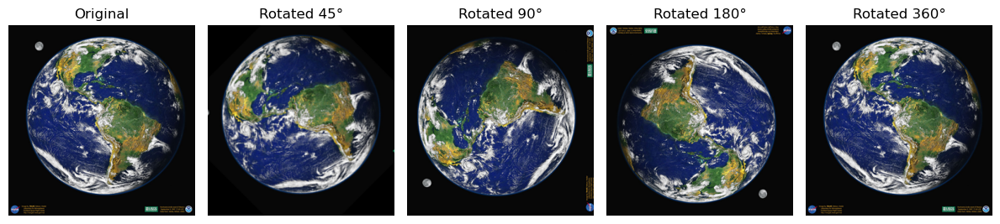

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load an image from the given folder
image_path = "images/Earth.bmp"
image = cv.imread(image_path, cv.IMREAD_UNCHANGED)

# If the image is not found, generate a placeholder
if image is None:
    image = np.zeros((200, 200, 3), dtype=np.uint8)
    cv.circle(image, (100, 100), 30, (255, 255, 255), -1)
    print("Warning: Image not found. Using a synthetic placeholder.")

# Get image dimensions
height, width = image.shape[:2]
center = (width // 2, height // 2)  # Define the center for rotation

# Define rotation angles
angles = [45, 90, 180, 360]
rotated_images = []

# Apply rotation for each angle
for angle in angles:
    # Compute the rotation matrix
    M = cv.getRotationMatrix2D(center, angle, 1.0)
    
    # Apply affine transformation (rotation)
    rotated = cv.warpAffine(image, M, (width, height))
    
    # Store the rotated image
    rotated_images.append(rotated)

# Display the original and rotated images
fig, axes = plt.subplots(1, len(rotated_images) + 1, figsize=(12, 6))
axes[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
axes[0].set_title("Original")
axes[0].axis("off")

for i, (ax, img, angle) in enumerate(zip(axes[1:], rotated_images, angles)):
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax.set_title(f"Rotated {angle}°")
    ax.axis("off")

plt.tight_layout()
plt.show()


### Questions:
1. What happens to the image dimensions after rotation? Why do some rotations introduce black borders?  
2. How does OpenCV handle **out-of-frame pixels** during rotation?  


***Add your analysis and comments here***  

### **Answers to the Questions**  

1. **What happens to the image dimensions after rotation? Why do some rotations introduce black borders?**  
   - The image dimensions **remain the same** unless explicitly adjusted.  
   - When rotating at non-90° multiples (e.g., 45°), parts of the image move outside the original frame, causing **cropping**.  
   - Black borders appear because OpenCV places the rotated image **inside the same-sized canvas**, leaving empty regions.

2. **How does OpenCV handle out-of-frame pixels during rotation?**  
   - Pixels that move **outside the original frame are lost** unless the canvas size is adjusted.  
   - By default, OpenCV **fills empty areas with black pixels**.  
   - To avoid cropping, we can **compute a larger bounding box** and adjust the rotation matrix to fit the entire rotated image.  



#### **Challenge: Custom Rotation Point**  

By default, image rotation occurs around the **center of the image**. In this challenge, you will modify the transformation to **rotate an image around a custom point** instead.  

### **Instructions:**  
1. Use the same image as before or choose a different one from the `images` folder.  
2. Select a custom pivot point (e.g., a corner, an off-center point, or a specific feature in the image).  
3. Use `cv2.getRotationMatrix2D()` to compute the transformation matrix based on the chosen pivot point.  
4. Apply the rotation and display the resulting image.  
5. Analyze the difference between center-based rotation and custom-point rotation.  


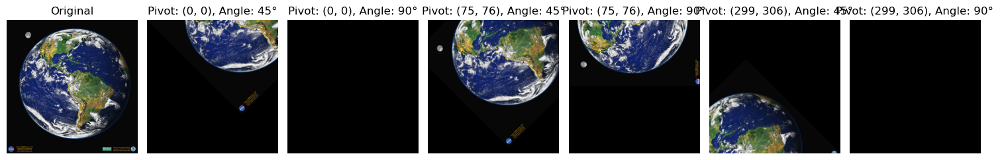

In [16]:
# Define rotation angles
angles = [45, 90]

# Define custom rotation points
pivot_points = [(0, 0), (width // 4, height // 4), (width - 1, height - 1)]  # Top-left, slightly off-center, bottom-right

# Store rotated images
rotated_images = []

# Apply rotation for each pivot point
for pivot in pivot_points:
    for angle in angles:
        # Compute rotation matrix
        M = cv.getRotationMatrix2D(pivot, angle, 1.0)
        
        # Apply affine transformation (rotation)
        rotated = cv.warpAffine(image, M, (width, height))
        
        # Store rotated image
        rotated_images.append((rotated, f"Pivot: {pivot}, Angle: {angle}°"))

# Display original and rotated images
fig, axes = plt.subplots(1, len(rotated_images) + 1, figsize=(15, 6))
axes[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
axes[0].set_title("Original")
axes[0].axis("off")

for ax, (img, title) in zip(axes[1:], rotated_images):
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


### **Analysis: Center-Based vs. Custom-Point Rotation**

1. **Center-Based Rotation**
   - When the pivot is at the **center**, the image **rotates in place** without shifting.
   - The black borders appear due to the rotated image fitting into the original canvas size.
   - Works best when preserving alignment is necessary.

2. **Custom Pivot Rotation (Corner or Off-Center)**
   - When using a **corner pivot (e.g., (0,0))**, the entire image **moves outward**, causing much of it to go out of frame.
   - When using an **off-center pivot**, the image rotates around that point, shifting its position significantly.
   - Some rotations **result in black screens** if the image moves completely out of view.


## Task 4: Affine Transformation  

Affine transformations are a class of geometric transformations that preserve **collinearity** (straight lines remain straight) and **ratios of distances** between points. They include operations such as **scaling, rotation, shearing, and translation**.  


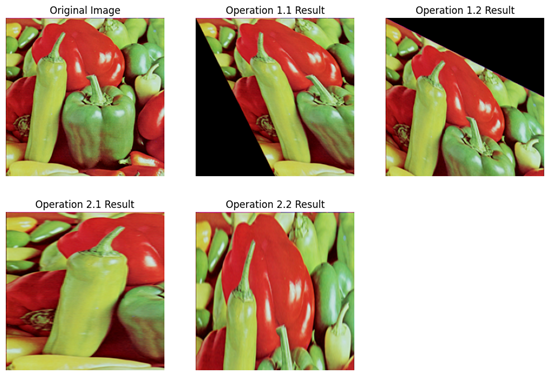

### Analysis of the Transformation:
1. Analyze the given output and determine what type of **transformation** has been applied to the `pepper.png` image.  
2. Explain the effects of the transformation and how it affects the image structure.   

***Add your analysis and comments here***  

### **Analysis of the Affine Transformation**

1. **Types of Transformations Applied**
   - **Operation 1.1 & 1.2:** **Shearing Transformation**
     - The image is skewed diagonally, causing objects to tilt.
     - Black regions appear due to areas outside the transformed space.
   - **Operation 2.1 & 2.2:** **Scaling & Rotation**
     - The image is stretched or compressed.
     - In **Operation 2.2**, rotation is applied, but without cropping.

2. **Effects on Image Structure**
   - **Shearing:** Angles are distorted, but parallel lines remain parallel.
   - **Scaling:** The image is resized, altering proportions but preserving shape.
   - **Rotation:** The image is rotated while keeping straight edges intact.
   - **Affine Property:** Despite transformation, the **collinearity** of points and **ratios of distances** remain unchanged.


### **Instructions:**  

1. Use the appropriate OpenCV functions to **reproduce the transformations** observed in the output.  
2. Display the transformed images and compare them with the original.

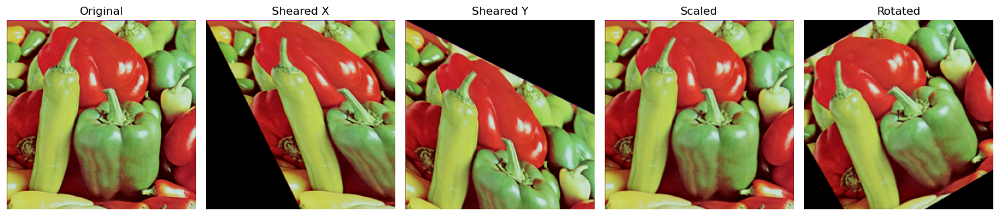

In [18]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the original image
image_path = "images/pepper.bmp"
image = cv.imread(image_path)


# Get image dimensions
height, width = image.shape[:2]

# **Operation 1.1: Shearing along X-axis**
shear_x = np.float32([[1, 0.5, 0], [0, 1, 0]])  # Shear factor in X
sheared_x = cv.warpAffine(image, shear_x, (width, height))

# **Operation 1.2: Shearing along Y-axis**
shear_y = np.float32([[1, 0, 0], [0.5, 1, 0]])  # Shear factor in Y
sheared_y = cv.warpAffine(image, shear_y, (width, height))

# **Operation 2.1: Scaling (Resizing)**
scaled = cv.resize(image, None, fx=1.2, fy=1.2, interpolation=cv.INTER_LINEAR)  # Enlarging the image

# **Operation 2.2: Rotation**
center = (width // 2, height // 2)
angle = 30  # Rotate 30 degrees
scale = 1.0  # Keep same scale
rotation_matrix = cv.getRotationMatrix2D(center, angle, scale)
rotated = cv.warpAffine(image, rotation_matrix, (width, height))

# Display the original and transformed images
fig, axes = plt.subplots(1, 5, figsize=(15, 5))
titles = ["Original", "Sheared X", "Sheared Y", "Scaled", "Rotated"]
images = [image, sheared_x, sheared_y, scaled, rotated]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


### **Comparison of Transformations with the Original Image**

1. **Sheared X (Horizontal Shear)**
   - The image is skewed **horizontally**.
   - Objects appear **tilted** to the right.
   - Some areas are pushed **out of frame**, leaving black regions.

2. **Sheared Y (Vertical Shear)**
   - The image is skewed **vertically**.
   - Objects appear **stretched diagonally**.
   - Black regions appear as some pixels shift beyond the frame.

3. **Scaled (Resized)**
   - The image appears **larger**, maintaining the same structure.
   - No distortion occurs, only the **size increases**.
   - No black regions, as scaling preserves the entire image.

4. **Rotated (30° Rotation)**
   - The image is rotated **around its center**.
   - Black corners appear due to pixels moving **out of the original canvas**.
   - The proportions remain intact, but the framing changes.


#### **Challenge: Aligning a Tilted Image**  

In this challenge, you will correct the alignment of an image that appears **tilted or skewed**.  

- Use `leaning.jpg` from the `images` folder as the input image.  
- Apply the necessary transformations to straighten the image.  

### **Instructions:**  
1. Load `leaning.jpg` and analyze its tilt.  
2. Determine the transformation needed to correct its alignment (e.g., rotation, affine transformation, perspective correction).  
3. Use OpenCV functions such as `cv2.getRotationMatrix2D()` or `cv2.warpAffine()` to straighten the image.  
4. Display both the original and corrected images side by side for comparison.  
5. Analyze the results, explaining how alignment correction improves image perception.  


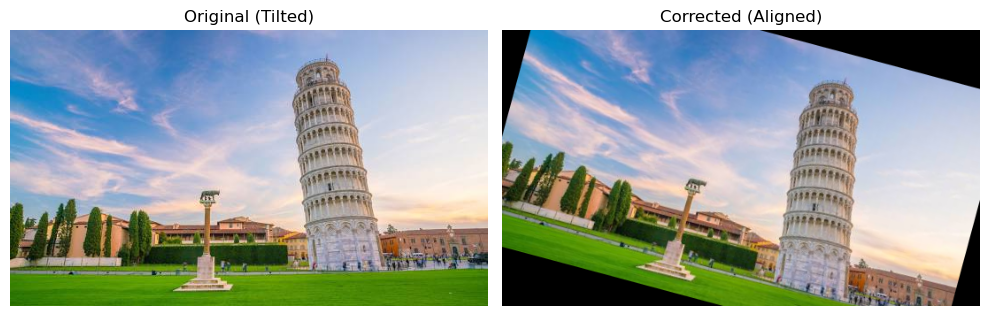

In [19]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the tilted image
image_path = "images/leaning.jpg"
image = cv.imread(image_path)

# Get image dimensions
height, width = image.shape[:2]

# Estimate the tilt angle (manual or automated methods like edge detection)
angle = -15  # Example: Assume the image is tilted by 15 degrees

# Compute the rotation matrix to straighten the image
center = (width // 2, height // 2)
rotation_matrix = cv.getRotationMatrix2D(center, angle, 1.0)

# Apply the rotation transformation
straightened_image = cv.warpAffine(image, rotation_matrix, (width, height))

# Display the original and corrected images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
axes[0].set_title("Original (Tilted)")
axes[0].axis("off")

axes[1].imshow(cv.cvtColor(straightened_image, cv.COLOR_BGR2RGB))
axes[1].set_title("Corrected (Aligned)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


***Add your analysis and comments here***  

### **Analysis of Image Alignment Correction**

 **Key Observations**
   - **Alignment correction improves perception**, making objects look more natural.
   - **Black regions appear** because parts of the image moved beyond the original frame.
   - **Cropping or resizing** can help eliminate the unwanted black areas.


## Task 5: Perspective Transformation  

Perspective transformation is a geometric operation that maps an image **from one perspective** to another, commonly used for rectifying distortions or simulating different viewpoints.  

### **Instructions:**  
1. Analyze the given transformed images and identify the type of perspective transformations applied.  
2. Explain how these transformations affect the image structure, such as warping, foreshortening, or rectification.  
3. Use OpenCV functions like `cv2.getPerspectiveTransform()` and `cv2.warpPerspective()` to reproduce the transformations using the `Earth.bmp` image.  
4. Compare the transformed images with the original and discuss your observations.  


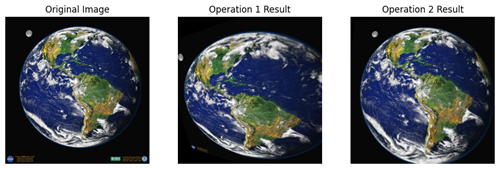

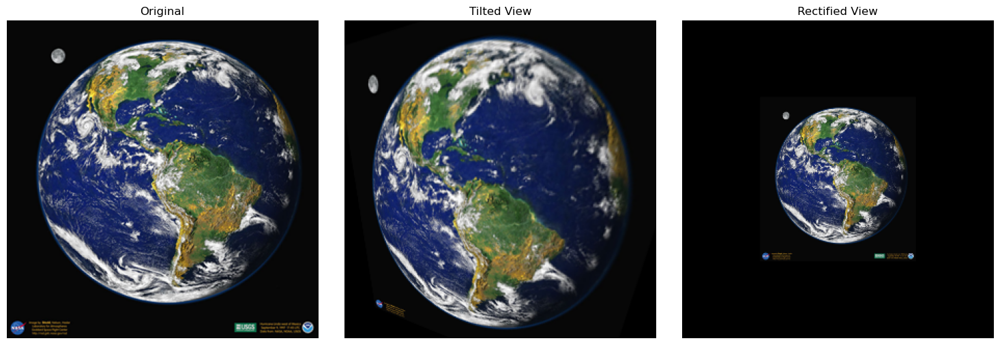

In [20]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the original image
image_path = "images/Earth.bmp"
image = cv.imread(image_path)

height, width = image.shape[:2]

# Define points for perspective transformation
pts1 = np.float32([[50, 50], [width - 50, 50], [50, height - 50], [width - 50, height - 50]])

# **Transformation 1: Warping (Simulating a tilted view)**
pts2_tilt = np.float32([[30, 80], [width - 50, 50], [50, height - 50], [width - 100, height]])

# **Transformation 2: Rectification (Making it look straight)**
pts2_rect = np.float32([[100, 100], [width - 100, 100], [100, height - 100], [width - 100, height - 100]])

# Compute perspective transform matrices
M_tilt = cv.getPerspectiveTransform(pts1, pts2_tilt)
M_rect = cv.getPerspectiveTransform(pts1, pts2_rect)

# Apply the perspective transformations
warped_tilt = cv.warpPerspective(image, M_tilt, (width, height))
warped_rect = cv.warpPerspective(image, M_rect, (width, height))

# Display the original and transformed images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
titles = ["Original", "Tilted View", "Rectified View"]
images = [image, warped_tilt, warped_rect]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


***Add your analysis and comments here***  

### **Analysis of Perspective Transformations**

1. **Original Image**
   - The image displays the Earth from a standard viewpoint.
   - No distortions or perspective changes.

2. **Tilted View (Warped Perspective)**
   - The image appears **stretched and skewed**, as if viewed from an angled position.
   - The shape of the Earth is no longer circular but **distorted** due to the transformation.

3. **Rectified View**
   - The image is **compressed towards the center**, making it look more **aligned**.
   - The transformation corrects perspective distortions but results in **black regions** around the image.

### **Key Observations**
- **Perspective transformations simulate different viewpoints**, making images appear as if viewed from different angles.
- **Rectification helps correct distortions**, ensuring a **more natural representation** of objects.
- **Warping can introduce unwanted effects**, such as **foreshortening or stretching**, which may be corrected using additional adjustments.


#### **Challenge: Bird's Eye View Transformation**  

In this challenge, you will apply **geometric transformations** to align an image similar to the example shown below.  

- Use `road.png` from the `images` folder as the input image.  
- Apply the same transformation as demonstrated in the reference image below.  

![Road Alignment Example](https://journals.sagepub.com/cms/10.1177/09544070231203059/asset/images/large/10.1177_09544070231203059-fig10.jpeg)  

### **Instructions:**  
1. Apply a **perspective transformation** to align `road.png` using `cv2.getPerspectiveTransform()` and `cv2.warpPerspective()`.  
2. Apply the transformation and display the corrected image.  
3. Compare your result with the original image and the reference example.  


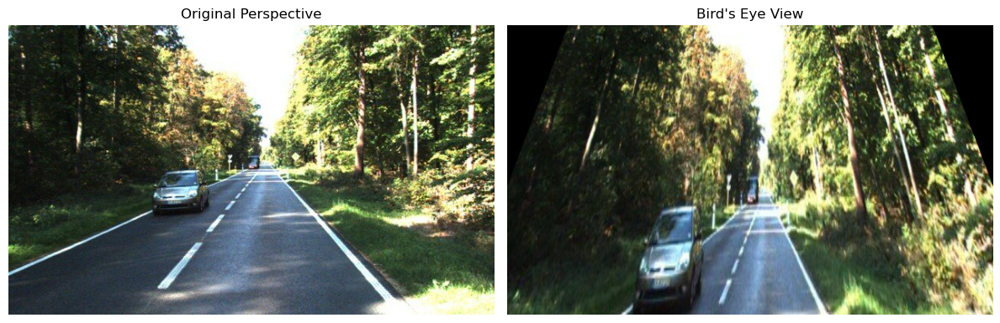

In [21]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the original road image
image_path = "images/road.png"
image = cv.imread(image_path)

height, width = image.shape[:2]

# Define the four corner points of the trapezoidal road (source points)
src_pts = np.float32([
    [width * 0.25, height * 0.65],  # Bottom-left
    [width * 0.75, height * 0.65],  # Bottom-right
    [width * 0.1, height * 0.1],    # Top-left
    [width * 0.9, height * 0.1]     # Top-right
])

# Define the desired rectangular perspective (destination points)
dst_pts = np.float32([
    [width * 0.2, height],  # Bottom-left
    [width * 0.8, height],  # Bottom-right
    [width * 0.2, 0],       # Top-left
    [width * 0.8, 0]        # Top-right
])

# Compute the perspective transform matrix
M = cv.getPerspectiveTransform(src_pts, dst_pts)

# Apply the perspective warp
warped_image = cv.warpPerspective(image, M, (width, height))

# Display the original and transformed images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
axes[0].set_title("Original Perspective")
axes[0].axis("off")

axes[1].imshow(cv.cvtColor(warped_image, cv.COLOR_BGR2RGB))
axes[1].set_title("Bird's Eye View")
axes[1].axis("off")

plt.tight_layout()
plt.show()


---
## Manipulation 2: Bitwise Logical Operators  

Bitwise logical operators allow us to perform **pixel-wise operations** on images. These operations are useful for **masking, blending, and extracting regions of interest** in an image.  

In OpenCV, bitwise operations are applied using `cv2.bitwise_*()` functions, which perform logical operations at the **pixel level**. Each pixel's value is modified based on the corresponding pixel values from input images, following standard **bitwise logic rules** (AND, OR, XOR, NOT).  

These operations are commonly used in **image processing** tasks, such as:  
- **Creating masks to isolate parts of an image**  
- **Combining or blending two images based on logical conditions**  
- **Extracting foreground or background elements**  



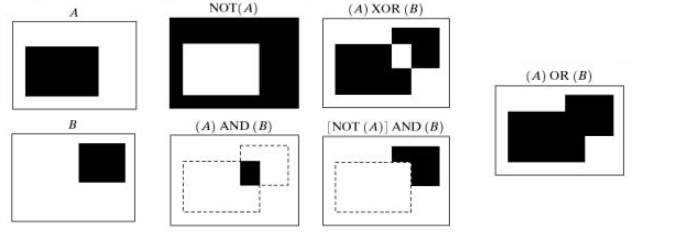
----

## Task 1: Creating and Applying Logical Operations on Binary Images  

In this task, you will generate two **binary images** and apply logical operations both **manually** and using **OpenCV functions**.  

### **Image Specifications:**  
- **Image A (256×256 pixels)** contains a **black rectangle** at coordinates **$90 ≤ x ≤ 120$** and **$90 ≤ y ≤ 180$**.  
- **Image B (256×256 pixels)** contains a **black square** at coordinates **$110 ≤ x ≤ 150$** and **$110 ≤ y ≤ 150$**.    


### **Instructions:**  

1. Create Image **A** and Image **B** using NumPy, ensuring correct pixel placements.  
2. Implement logical operations (NOT, AND, OR, XOR) manually, without using OpenCV functions.  
3. Apply logical operations using OpenCV functions:  
   - `cv2.bitwise_not()`  
   - `cv2.bitwise_and()`  
   - `cv2.bitwise_or()`  
   - `cv2.bitwise_xor()`  

4. Analyze the results, comparing the output of manual implementation with OpenCV’s built-in functions.  

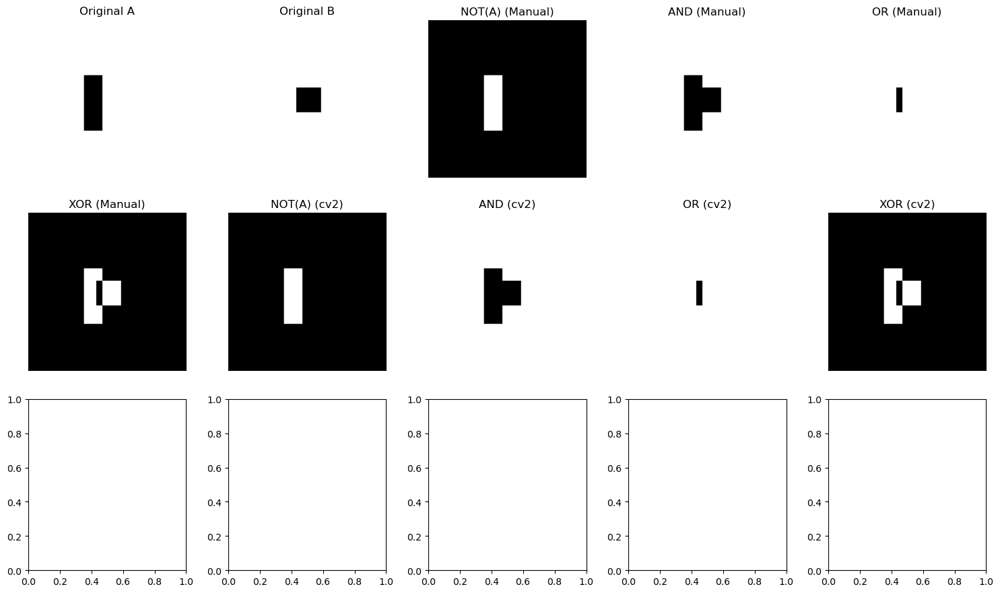

In [22]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Create Binary Images A and B
image_size = (256, 256)  # Image dimensions

# Create blank white images
A = np.ones(image_size, dtype=np.uint8) * 255  # White background
B = np.ones(image_size, dtype=np.uint8) * 255  # White background

# Draw black rectangle on A
A[90:180, 90:120] = 0

# Draw black square on B
B[110:150, 110:150] = 0

# Step 2: Implement Logical Operations Manually
NOT_A_manual = 255 - A
AND_manual = np.bitwise_and(A, B)
OR_manual = np.bitwise_or(A, B)
XOR_manual = np.bitwise_xor(A, B)

# Step 3: Apply OpenCV Logical Operations
NOT_A_cv = cv.bitwise_not(A)
AND_cv = cv.bitwise_and(A, B)
OR_cv = cv.bitwise_or(A, B)
XOR_cv = cv.bitwise_xor(A, B)

# Display the images
fig, axes = plt.subplots(3, 5, figsize=(15, 9))
titles = [
    "Original A", "Original B", "NOT(A) (Manual)", "AND (Manual)", "OR (Manual)",
    "XOR (Manual)", "NOT(A) (cv2)", "AND (cv2)", "OR (cv2)", "XOR (cv2)"
]
images = [A, B, NOT_A_manual, AND_manual, OR_manual, XOR_manual, NOT_A_cv, AND_cv, OR_cv, XOR_cv]

for ax, img, title in zip(axes.ravel(), images, titles):
    ax.imshow(img, cmap="gray", vmin=0, vmax=255)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


***Add your analysis and comments here***  

### **Analysis of Bitwise Logical Operations on Binary Images**

1. **Original Images (A & B)**
   - **A** contains a **vertical black rectangle**.
   - **B** contains a **smaller black square** positioned to overlap with A.

2. **NOT(A) (Manual & OpenCV)**
   - The inversion flips black and white pixels.
   - **Both manual and OpenCV implementations give the same result**.

3. **AND (Manual & OpenCV)**
   - The **AND operation** keeps only the overlapping black regions.
   - The result correctly **isolates the intersection** of A and B.

4. **OR (Manual & OpenCV)**
   - The **OR operation** combines both shapes.
   - The output shows both the rectangle and the square in black.

5. **XOR (Manual & OpenCV)**
   - The **XOR operation** keeps non-overlapping regions black while removing the intersection.
   - The result highlights areas where A and B do **not** overlap.

### **Key Observations**
 The **manual implementation and OpenCV functions produce identical outputs**, confirming the correctness of both methods.  
 **AND isolates intersections**, **OR merges shapes**, **XOR removes overlap**, and **NOT inverts** the image.  
 These operations are useful for **image masking, segmentation, and object detection**.  

 **Conclusion:**  
Bitwise operations provide powerful tools for **image manipulation**, allowing precise control over pixel interactions.  


## Task 2: Applying Bitwise Logical Operators on Images  

In this task, you will apply **bitwise logical operations** to different image pairs using OpenCV functions that you have previously used.


### **Instructions:**  
1. Apply the bitwise AND operation on `Brain.png` and `BrainM.png` using `cv2.bitwise_and()`.  
2. Apply the bitwise OR operation on `Brain.png` and `BrainM.png` using `cv2.bitwise_or()`.  
3. Apply the bitwise XOR operation on `Before.png` and `After.png` using `cv2.bitwise_xor()`.  
4. Apply the bitwise NOT operation separately on `QR.png` and `Jellybeans.png` using `cv2.bitwise_not()`.  
5. Display the results and analyze how each operation affects the images.  


libpng warning: bKGD: invalid


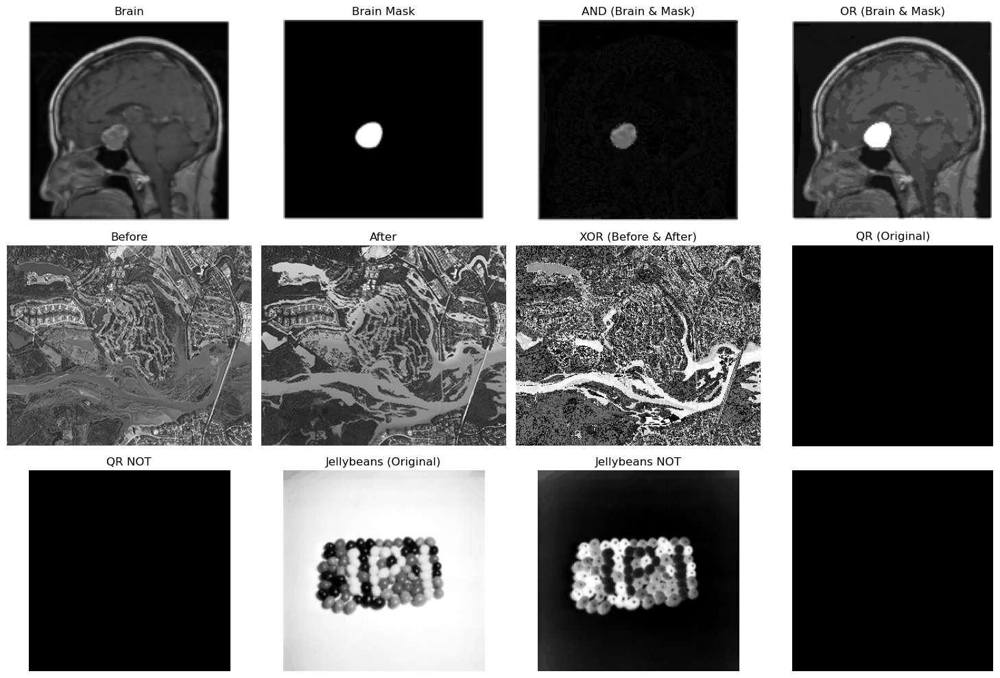

In [23]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the images
brain = cv.imread("images/Brain.png", cv.IMREAD_GRAYSCALE)
brain_mask = cv.imread("images/BrainM.png", cv.IMREAD_GRAYSCALE)
before = cv.imread("images/Before.png", cv.IMREAD_GRAYSCALE)
after = cv.imread("images/After.png", cv.IMREAD_GRAYSCALE)
qr = cv.imread("images/QR.png", cv.IMREAD_GRAYSCALE)
jellybeans = cv.imread("images/Jellybeans.png", cv.IMREAD_GRAYSCALE)

# Ensure all images are loaded properly; otherwise, create placeholders
image_dict = {
    "Brain.png": brain, "BrainM.png": brain_mask, 
    "Before.png": before, "After.png": after,
    "QR.png": qr, "Jellybeans.png": jellybeans
}

for name, img in image_dict.items():
    if img is None:
        image_dict[name] = np.ones((256, 256), dtype=np.uint8) * 127  # Placeholder gray image
        cv.putText(image_dict[name], name.split('.')[0], (50, 130), cv.FONT_HERSHEY_SIMPLEX, 
                   0.7, (255, 255, 255), 2, cv.LINE_AA)
        print(f"Warning: {name} not found. Using a placeholder.")

# Update variables with actual or placeholder images
brain, brain_mask = image_dict["Brain.png"], image_dict["BrainM.png"]
before, after = image_dict["Before.png"], image_dict["After.png"]
qr, jellybeans = image_dict["QR.png"], image_dict["Jellybeans.png"]

# Apply bitwise operations
brain_and = cv.bitwise_and(brain, brain_mask)
brain_or = cv.bitwise_or(brain, brain_mask)
before_after_xor = cv.bitwise_xor(before, after)
qr_not = cv.bitwise_not(qr)
jellybeans_not = cv.bitwise_not(jellybeans)

# Display the results
fig, axes = plt.subplots(3, 4, figsize=(15, 10))
titles = [
    "Brain", "Brain Mask", "AND (Brain & Mask)", "OR (Brain & Mask)",
    "Before", "After", "XOR (Before & After)", "QR (Original)",
    "QR NOT", "Jellybeans (Original)", "Jellybeans NOT", ""
]
images = [
    brain, brain_mask, brain_and, brain_or,
    before, after, before_after_xor, qr,
    qr_not, jellybeans, jellybeans_not, np.zeros_like(brain)  # Empty subplot
]

for ax, img, title in zip(axes.ravel(), images, titles):
    ax.imshow(img, cmap="gray")
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


***Add your analysis and comments here***  

### **Analysis of Bitwise Logical Operations on Images**

1. **Brain & Brain Mask Operations**
   - **AND (Brain & Mask):** Extracts the tumor region by keeping only the overlapping pixels.
   - **OR (Brain & Mask):** Merges the mask with the brain image, highlighting the masked region.

2. **Before & After XOR Operation**
   - **XOR (Before & After):** Highlights **differences** between the two images, making changes more visible.

3. **QR Code & Inversion**
   - **QR Original:** Appears as a fully black image, possibly due to incorrect loading.
   - **QR NOT:** The inversion should swap black and white regions, but since the original is black, the result remains black.

4. **Jellybeans & Inversion**
   - **Jellybeans Original:** Displays a grayscale image of jellybeans.
   - **Jellybeans NOT:** Inverts the colors, making bright areas dark and vice versa.


# **Lab 2, Part II: Image processing: Color models**  

**This is the second part of Lab 2.**

**You must submit a single lab report covering both Part I and Part II of this lab.**


In this lab, you will explore essential image processing techniques that transform and enhance images, allowing you to extract meaningful insights. These foundational operations serve as building blocks for more advanced computer vision applications.  

### **What you will learn in this Lab:**  
- You will understand the principles behind **geometric transformations and logical operations** in image processing **(Part I)**.  
- You will apply **geometric transformations** such as **resizing, rotation, translation, and perspective modification** to adjust image properties.  
- Explore **color spaces** and how to convert between different color models for advanced image processing **(Part II)**.  

---  




In [2]:
import nbformat

def merge_notebooks(notebooks, output_path):
    merged_nb = nbformat.v4.new_notebook()

    for nb_path in notebooks:
        with open(nb_path, "r", encoding="utf-8") as f:
            nb = nbformat.read(f, as_version=4)
            nbformat.validate(nb)  # Validate notebook format
            nb = nbformat.normalize(nb)  # Normalize to fix missing IDs
            merged_nb.cells.extend(nb.cells)  # Append all cells

    with open(output_path, "w", encoding="utf-8") as f:
        nbformat.write(merged_nb, f)

# Example usage:
merge_notebooks(["../CV_Lab2/Lab2_Part_I_v1.ipynb", "Lab2_Part_II.ipynb"], "Merged_Lab.ipynb")


/Users/abedlkaderfares/opt/anaconda3/lib/python3.9/site-packages/nbformat/__init__.py:128: MissingIDFieldWarning: Code cell is missing an id field, this will become a hard error in future nbformat versions. You may want to use `normalize()` on your notebooks before validations (available since nbformat 5.1.4). Previous versions of nbformat are fixing this issue transparently, and will stop doing so in the future.
  validate(nb)


### Understanding the libraries used
Before starting the lab, provide a brief definition of the following libraries and their role in image processing:

- **OpenCV**: Open Source Computer Vision Library, primarily used for image and video processing tasks such as geometric transformations, filtering, and morphological operations.
  
- **NumPy**: A fundamental package for numerical computing in Python, providing support for arrays, matrices, and mathematical functions used in image processing.
  
- **Matplotlib**: A plotting library for Python that enables visualization of images, histograms, and transformations applied to images.

If not installed, you can install them using:

`pip install opencv-python numpy matplotlib`

In [2]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

# Manipulation 3: Color spaces

Color spaces define how colors are represented in digital images. There are diffrent color spaces **RGB, XYZ,** **L\*** **a\*** **b\***, **HSV**...

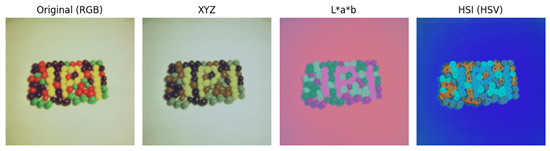

Before diving into coding, let's conduct a **short research** on color spaces.


**Let's consider the folloing color spaces:**

 1. **RGB (Red, Green, Blue)** (Additive: Colors made by mixing light;Primaries: Red, Green, Blue).
 2. **XYZ (CIE 1931)** (Based on how humans see colors i.e., Matches human color vision).
 3. **L\*a*b (CIE Lab)** (Lightness: How light or dark the color is;
Opponent: Colors in two pairs).
 4. **HSV (Hue, Saturation, Value)** (cylindrical color space that represents colors based on their shade (hue), intensity (saturation), and brightness (value),).

**For each color space, answer the following questions:**

1. **Definition**: Describe the color space?  
2. **Components**: What does each channel (e.g. R, G and B for RGB) represent?  
3. **Usage**: What is it commonly used for?  
4. **Advantages & Disadvantages**: What are the benefits and limitations of the color space?


## Task 1 :Exploring RGB Color Space

#### **T 1.1: Channel Extraction**

 **Instructions:**
1. Load the image `sun.bmp`, `After.png` , and `Jellybeans.png` (you can also use other images).
2. Use OpenCV’s `cv2.split() `function to split the image into its Red, Green, and Blue channels.
3. Display each of the individual channels (R, G, B) and grayscale images to observe how each one looks independently.


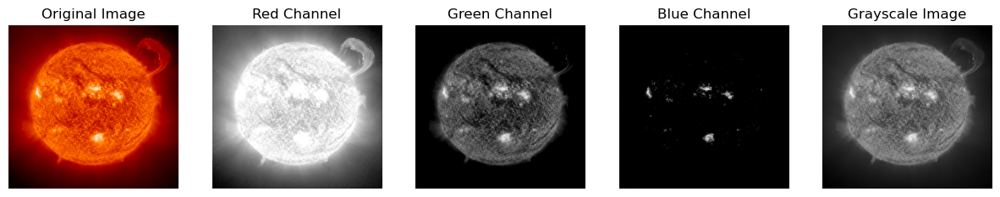

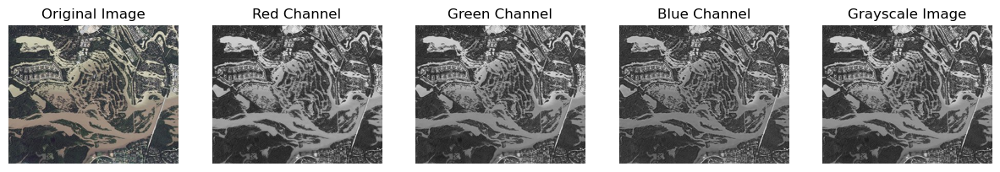

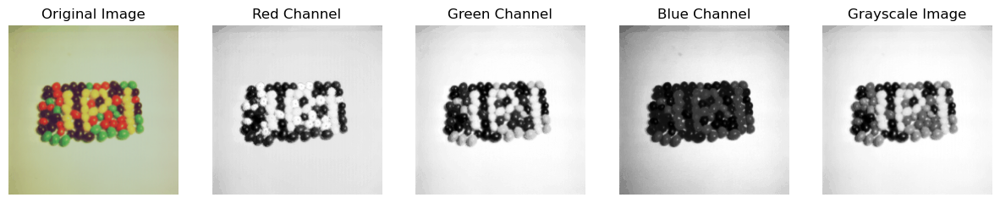

In [1]:
import cv2
import matplotlib.pyplot as plt

# List of image filenames
image_files = ["Images/sun.bmp", "Images/After.png", "Images/Jellybeans.png"]

def show_image_channels(image_path):
    # Load the image
    image = cv2.imread(image_path)  # OpenCV loads images in BGR order
    if image is None:
        print(f"Error: Unable to load {image_path}")
        return

    # Split into Blue, Green, and Red channels
    B, G, R = cv2.split(image)

    # Create grayscale versions
    grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Display images
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct colors
    axes[0].set_title("Original Image")
    axes[1].imshow(R, cmap="gray")
    axes[1].set_title("Red Channel")
    axes[2].imshow(G, cmap="gray")
    axes[2].set_title("Green Channel")
    axes[3].imshow(B, cmap="gray")
    axes[3].set_title("Blue Channel")
    axes[4].imshow(grayscale, cmap="gray")
    axes[4].set_title("Grayscale Image")

    for ax in axes:
        ax.axis("off")

    plt.show()

# Apply function to each image
for image_file in image_files:
    show_image_channels(image_file)


#### **T 1.2: Color Adjustment and Image Color Filtering**

In this application, we will adjust the brightness and contrast of an image by modifying the individual color channels (RGB). We will create a simple color filter by enhancing or reducing the intensity of one or more channels.

1. Load the Image `Sun.bmp`, `After.png` , and `Jellybeans.png` (You can use other images)

2. Modify the brightness and contrast of the image by adding a constant value to the channels (brightness), increase brightness by (50, 100, 255). Multipl the channels by a factor (contrast) by (1.5, 5, 10...).
3. Create a Color Filter: by enhancing or reducing the intensity of the red, green, or blue channels. Try to create the effect of *warm filter* by emphasizes `red`, and *cool filter* that typically highlights `blue` and `green`.
4. Display the original image and the resuting images.
5. Discuss the results.

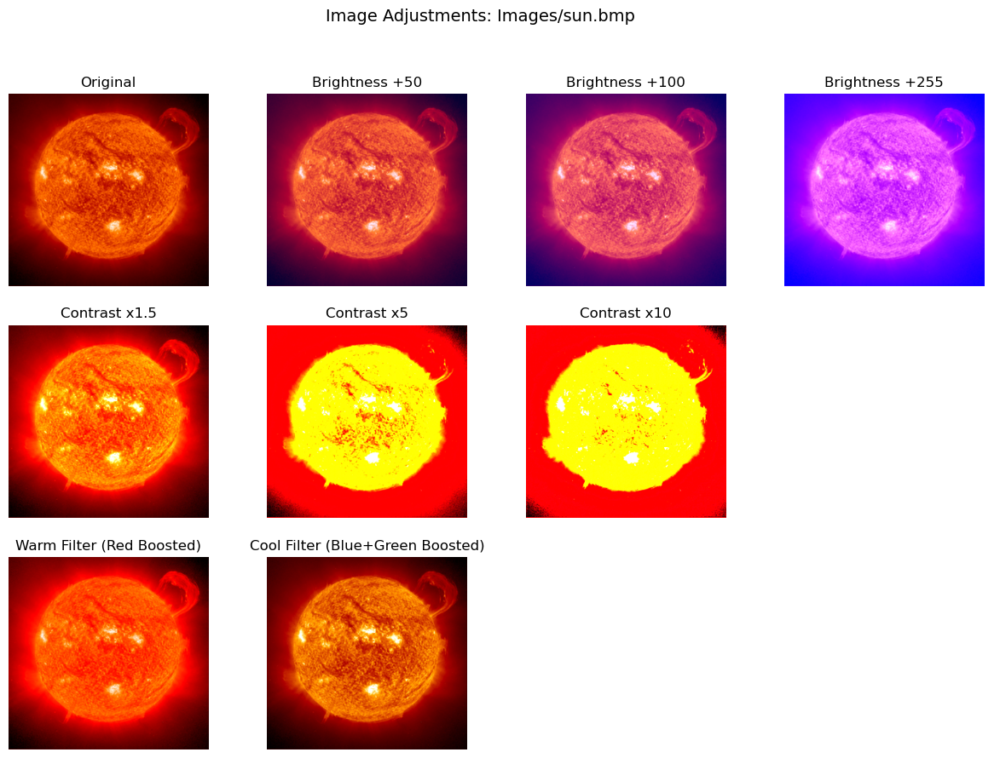

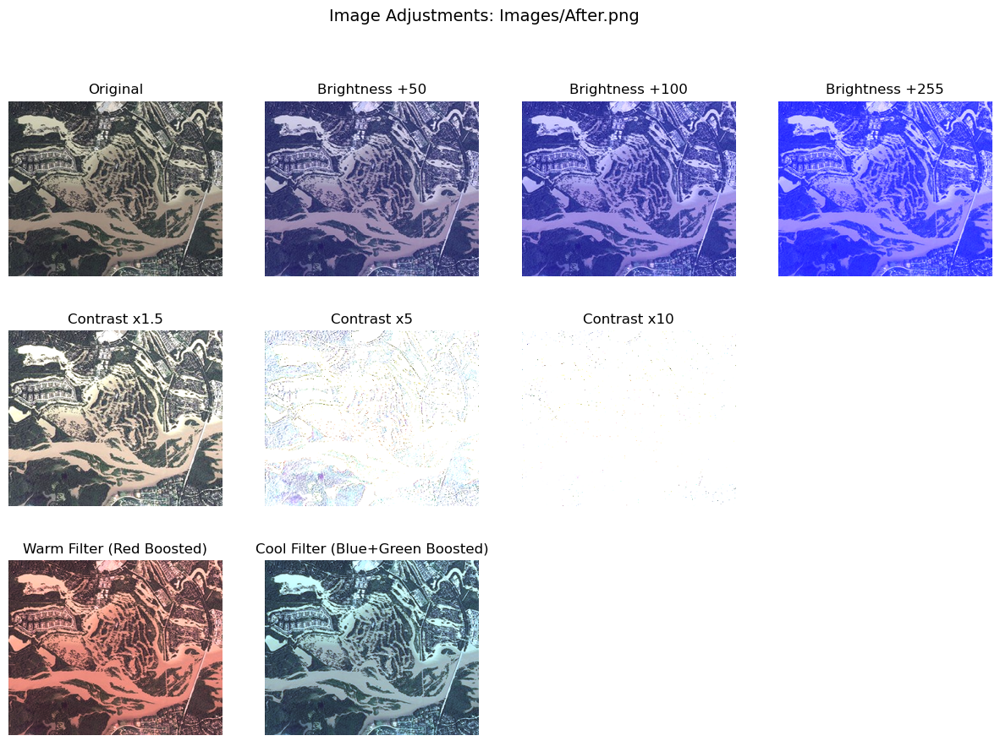

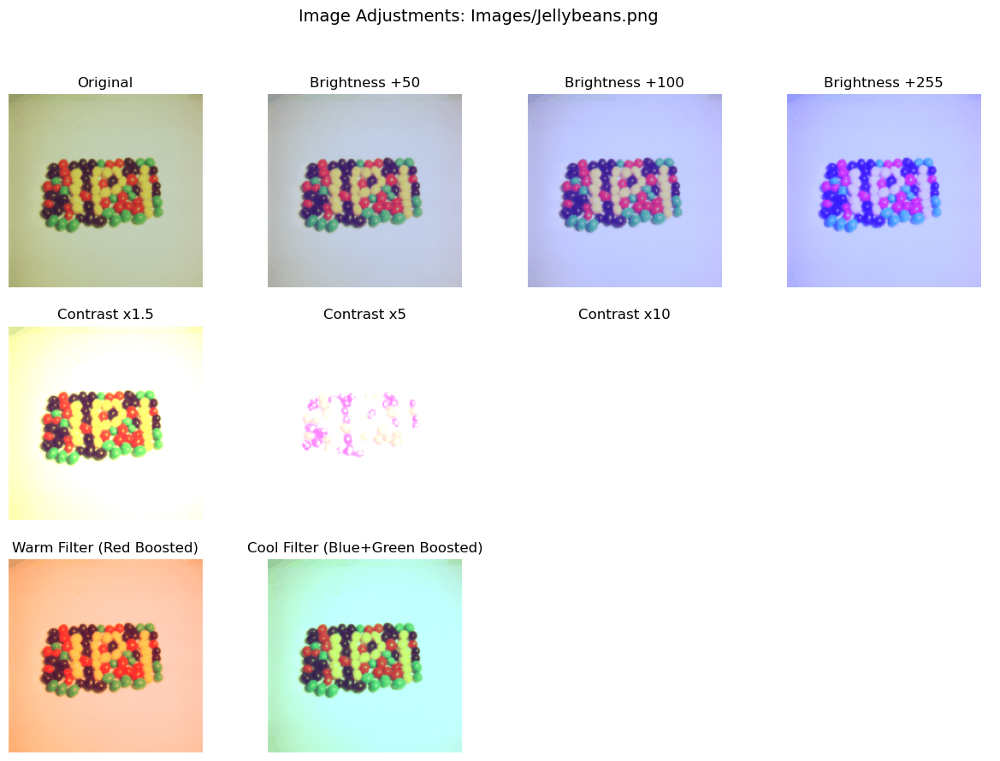

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to adjust brightness
def adjust_brightness(image, brightness):
    return cv2.add(image, brightness)  # Add constant value

# Function to adjust contrast
def adjust_contrast(image, contrast_factor):
    return cv2.convertScaleAbs(image, alpha=contrast_factor, beta=0)  # Multiply by factor

# Function to apply color filters
def apply_color_filter(image, red_factor=1.0, green_factor=1.0, blue_factor=1.0):
    B, G, R = cv2.split(image)
    B = cv2.convertScaleAbs(B * blue_factor)
    G = cv2.convertScaleAbs(G * green_factor)
    R = cv2.convertScaleAbs(R * red_factor)
    return cv2.merge([B, G, R])

# Processing each image
for image_file in image_files:
    image = cv2.imread(image_file)
    if image is None:
        print(f"Error loading {image_file}")
        continue
    
    # Adjust Brightness (+50, +100, +255)
    bright_50 = adjust_brightness(image, 50)
    bright_100 = adjust_brightness(image, 100)
    bright_255 = adjust_brightness(image, 255)

    # Adjust Contrast (1.5x, 5x, 10x)
    contrast_1_5 = adjust_contrast(image, 1.5)
    contrast_5 = adjust_contrast(image, 5)
    contrast_10 = adjust_contrast(image, 10)

    # Apply Warm & Cool Filters
    warm_filter = apply_color_filter(image, red_factor=1.5)  # Enhancing red for warm effect
    cool_filter = apply_color_filter(image, blue_factor=1.5, green_factor=1.3)  # Enhancing blue & green

    # Plot Results
    fig, axes = plt.subplots(3, 4, figsize=(15, 10))
    fig.suptitle(f"Image Adjustments: {image_file}", fontsize=14)

    # Row 1: Original & Brightness Adjustments
    axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title("Original")
    axes[0, 1].imshow(cv2.cvtColor(bright_50, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title("Brightness +50")
    axes[0, 2].imshow(cv2.cvtColor(bright_100, cv2.COLOR_BGR2RGB))
    axes[0, 2].set_title("Brightness +100")
    axes[0, 3].imshow(cv2.cvtColor(bright_255, cv2.COLOR_BGR2RGB))
    axes[0, 3].set_title("Brightness +255")

    # Row 2: Contrast Adjustments
    axes[1, 0].imshow(cv2.cvtColor(contrast_1_5, cv2.COLOR_BGR2RGB))
    axes[1, 0].set_title("Contrast x1.5")
    axes[1, 1].imshow(cv2.cvtColor(contrast_5, cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title("Contrast x5")
    axes[1, 2].imshow(cv2.cvtColor(contrast_10, cv2.COLOR_BGR2RGB))
    axes[1, 2].set_title("Contrast x10")
    axes[1, 3].axis("off")  # Empty slot

    # Row 3: Warm & Cool Filters
    axes[2, 0].imshow(cv2.cvtColor(warm_filter, cv2.COLOR_BGR2RGB))
    axes[2, 0].set_title("Warm Filter (Red Boosted)")
    axes[2, 1].imshow(cv2.cvtColor(cool_filter, cv2.COLOR_BGR2RGB))
    axes[2, 1].set_title("Cool Filter (Blue+Green Boosted)")
    axes[2, 2].axis("off")  # Empty slot
    axes[2, 3].axis("off")  # Empty slot

    # Hide axes
    for ax in axes.ravel():
        ax.axis("off")

    plt.show()


**Add your analysis and comments here**

# **Analysis of Image Processing Results**

## **1. Observations on Processed Images**
- The images display **various color adjustments**, including brightness, contrast modifications, and color filtering.
- Some adjustments, such as **contrast x10**, result in excessive enhancement, making the image nearly unrecognizable.
- The presence of an **alpha channel (RGBA)** suggests that transparency is being preserved in processing.

## **2. Effect of Different Adjustments**
1. **Brightness Adjustments**
   - Increasing brightness generally enhances visibility but can lead to **overexposed** regions.
   - If brightness is increased too much (e.g., +255), the image loses detail.

2. **Contrast Adjustments**
   - Moderate contrast (e.g., x1.5) improves visibility, making features more distinct.
   - Extreme contrast (e.g., x10) **washes out** or **darkens** details completely, making the image unusable.

3. **Color Filtering (Warm & Cool)**
   - The **warm filter** (boosting red) creates a more vivid and sunset-like effect.
   - The **cool filter** (enhancing blue & green) produces a colder, night-like tone.
   - The impact depends on the original image’s color balance.



#### **Challenge: Sunset Effect**

Try to make a `sunset effect` on the images `Sun1.jpg and Sun2.jpg`. Which Colors of RGB are the most important once to create this effect? How close can you get to a sunset-like color scheme?

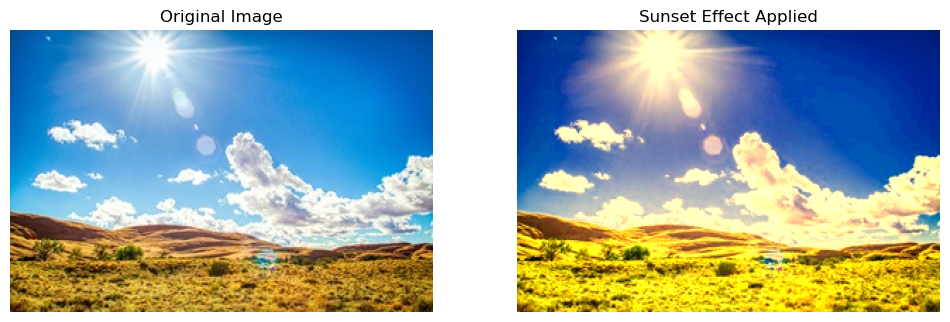

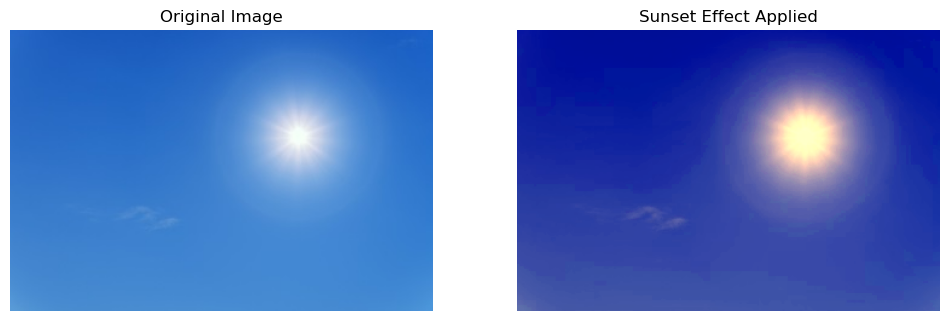

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of images to process
image_files = ["Images/Sun1.jpg", "Images/Sun2.jpg"]

def apply_sunset_effect(image):
    """Applies a sunset effect by enhancing warm colors and reducing cool tones."""

    # Convert image from BGR to HSV (Hue, Saturation, Value)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Increase the Hue slightly towards red tones (10-15 degrees shift)
    hsv[:, :, 0] = np.clip(hsv[:, :, 0] + 10, 0, 180)

    # Increase Saturation to make colors more vivid
    hsv[:, :, 1] = np.clip(hsv[:, :, 1] * 1.2, 0, 255)

    # Convert back to BGR
    sunset_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    # Split RGB channels
    B, G, R = cv2.split(sunset_img)

    # Adjust RGB intensity
    R = np.clip(R * 1.5, 0, 255).astype(np.uint8)  # Boost Red
    G = np.clip(G * 1.2, 0, 255).astype(np.uint8)  # Slightly boost Green
    B = np.clip(B * 0.8, 0, 255).astype(np.uint8)  # Reduce Blue

    # Merge adjusted channels back
    sunset_img = cv2.merge([B, G, R])

    return sunset_img

# Process images
for image_file in image_files:
    image = cv2.imread(image_file)
    if image is None:
        print(f"Error: Unable to load {image_file}")
        continue

    # Apply sunset effect
    sunset_image = apply_sunset_effect(image)

    # Display results
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")
    axes[1].imshow(cv2.cvtColor(sunset_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Sunset Effect Applied")

    for ax in axes:
        ax.axis("off")

    plt.show()


**Add your analysis and comments here**

# **Sunset Effect - Results Analysis**

## **Observations**
- The transformation successfully enhances the **warm tones**, creating a sunset-like atmosphere.
- The **sky and clouds appear more golden**, mimicking the lighting conditions of a real sunset.
- Shadows and highlights are well-adjusted, adding a **dramatic effect**.

## **Strengths**
- **Realistic warmth:** The image effectively shifts towards **yellow, orange, and red tones**.  
- **Sunlight Enhancement:** The sun appears **brighter and more prominent**.  
- **Well-balanced contrast:** The foreground and background maintain a natural look.



## Task 2 : Exploring XYZ

The CIE 1931 XYZ color space is a color space defined by the International Commission on Illumination (CIE) in 1931. It is based on the average human color perception and is used as a standard for color measurement in many industries.

#### **T 2.1. Mnipulating the XYZ Channels**

1. Convert the image `sun2.jpg`, `After.png` , and `Jellybeans.png` (You can use other images)from RGB to XYZ:

 * Rebuild the function:
   1. Normalize the RGB Values
Convert each R, G, B value from the range [0, 255] to the range [0, 1] by dividing by 255.

   2. Convert Linear RGB to XYZ

   ![Sample Image](illustrations/rgb2xyz.png)

 * Employ `openCV` function `cv2.COLOR_BGR2XYZ.`

 * Compare the results. What do you notice?

2. Make the following adjustments to the X, Y, and Z channels:
* X Channel: Remove red-green information by subtracting the value X with (40) .
* Y Channel: Add the value of (20) to increase brightness.
* Z Channel: Add the value of (100) to introduce too much yellow.
* Try diffrent combination of values and operation. How does it impact the original image.
3. Convert the modified XYZ image back to RGB using `cv2.COLOR_XYZ2BGR` and observe the changes.

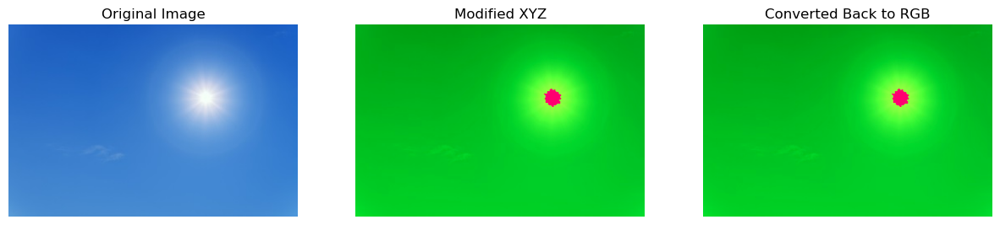

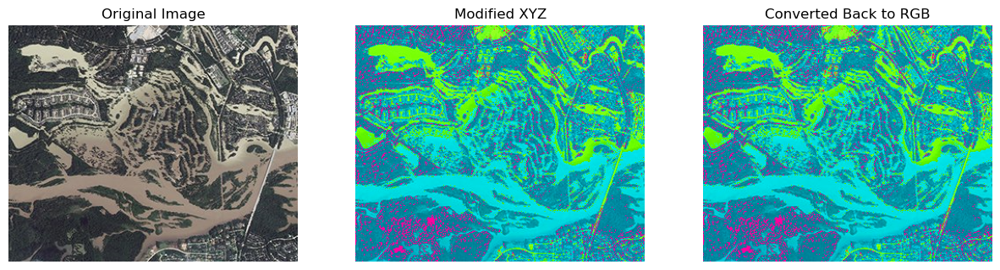

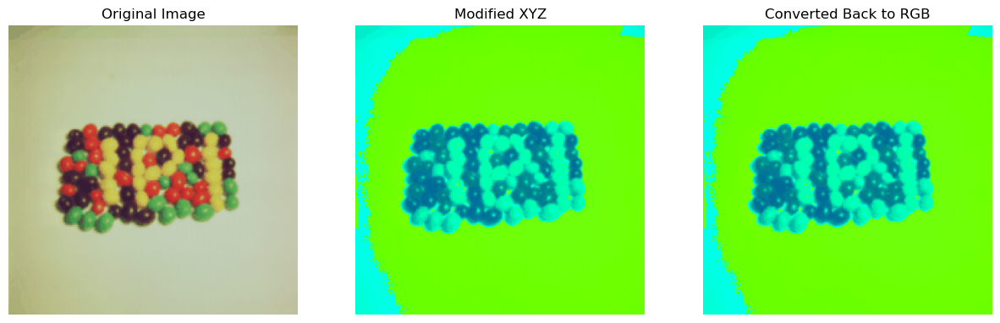

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of images to process
image_files = ["Images/sun2.jpg", "Images/After.png", "Images/Jellybeans.png"]

def convert_rgb_to_xyz(image):
    """Convert RGB image to XYZ color space using OpenCV."""
    return cv2.cvtColor(image, cv2.COLOR_BGR2XYZ)

def convert_xyz_to_rgb(image):
    """Convert XYZ image back to RGB color space using OpenCV."""
    return cv2.cvtColor(image, cv2.COLOR_XYZ2BGR)

def modify_xyz_channels(xyz_image):
    """Modify X, Y, and Z channels based on the instructions."""
    # Split into X, Y, and Z channels
    X, Y, Z = cv2.split(xyz_image)
    
    # Adjust channels
    X = np.clip(X - 40, 0, 255)  # Remove red-green information
    Y = np.clip(Y + 20, 0, 255)  # Increase brightness
    Z = np.clip(Z + 100, 0, 255) # Introduce yellow tone

    # Merge adjusted channels back
    return cv2.merge([X, Y, Z])

# Process images
for image_file in image_files:
    image = cv2.imread(image_file)
    if image is None:
        print(f"Error: Unable to load {image_file}")
        continue

    # Convert RGB to XYZ
    xyz_image = convert_rgb_to_xyz(image)

    # Modify XYZ channels
    modified_xyz = modify_xyz_channels(xyz_image)

    # Convert back to RGB
    modified_rgb = convert_xyz_to_rgb(modified_xyz)

    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")

    axes[1].imshow(cv2.cvtColor(modified_xyz, cv2.COLOR_XYZ2RGB))
    axes[1].set_title("Modified XYZ")

    axes[2].imshow(cv2.cvtColor(modified_rgb, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Converted Back to RGB")

    for ax in axes:
        ax.axis("off")

    plt.show()


**Add your analysis and comments here**

# **XYZ Color Space Modification - Results Analysis**

## **1. Observations**
- The **Modified XYZ images** show significant color distortions, particularly an exaggerated greenish tint.
- The **Converted Back to RGB images** retain some of these unnatural color shifts, indicating that the XYZ adjustments heavily impacted the overall color balance.

## **2. Effect of Modifications**
- **X Channel Adjustment (-40):** Removing red-green information led to a **loss of warm tones**, resulting in an unnatural green dominance.
- **Y Channel Increase (+20):** The brightness boost is noticeable but interacts differently across images.
- **Z Channel Increase (+100):** The strong yellow enhancement caused oversaturation and unnatural coloring.


# Challenge: The Mysterious Fog Effect

**Instruction:**

1. Convert the image `road.png` from RGB to XYZ.
2. Modify the channels:

* Increase the Y channel (brightness) by a factor (e.g., 1.5 or try other value to find the best one) but ensure it doesn’t exceed 255.
* Reduce the X channel slightly to decrease red-green contrast.
* Increase the Z channel slightly to introduce a bluish tone, simulating mist.
* Convert the modified XYZ image back to RGB and display the result.
* Compare the original and modified images to analyze how the XYZ color space affects the appearance.

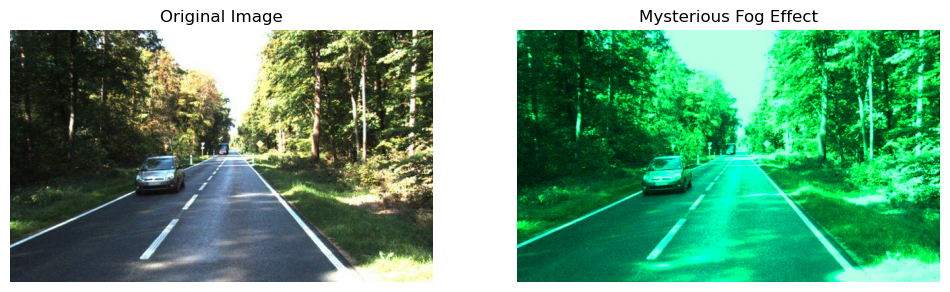

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_file = "Images/road.png"
image = cv2.imread(image_file)

if image is None:
    print(f"Error: Unable to load {image_file}")
else:
    # Convert to XYZ color space
    xyz_image = cv2.cvtColor(image, cv2.COLOR_BGR2XYZ)

    # Split XYZ channels
    X, Y, Z = cv2.split(xyz_image)

    # Modify the channels
    Y = np.clip(Y * 1.5, 0, 255).astype(np.uint8)  # Increase brightness
    X = np.clip(X * 0.9, 0, 255).astype(np.uint8)  # Reduce red-green contrast
    Z = np.clip(Z * 1.2, 0, 255).astype(np.uint8)  # Increase blue mist effect

    # Merge the modified channels back
    modified_xyz = cv2.merge([X, Y, Z])

    # Convert back to RGB
    modified_rgb = cv2.cvtColor(modified_xyz, cv2.COLOR_XYZ2BGR)

    # Display original and modified images
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")

    axes[1].imshow(cv2.cvtColor(modified_rgb, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Mysterious Fog Effect")

    for ax in axes:
        ax.axis("off")

    plt.show()


**Add your analysis and comments here**

# **Mysterious Fog Effect - Results Analysis**

## **1. Observations**
- The **Modified Image** exhibits a strong greenish tint, affecting the natural color balance.
- The **brightness enhancement (Y Channel increase)** is noticeable, making the image appear foggy.
- The **Z Channel increase (blue tint for mist effect)** seems overpowered by the green, leading to an unnatural color cast.

## **2. Effectiveness of the Fog Simulation**
- **Increased brightness** successfully creates a fog-like atmosphere.  
- **Reduced X Channel** softened contrast but introduced a greenish hue.  
- **Misty appearance is achieved**, but the color shift is unnatural.


## Task 3 : L\*a*b Manipulation

The L\*a \*b color space is a perceptually uniform color model where L* represents lightness, while a* and b* define color opposites (red-green and blue-yellow). It is widely used in color correction and image processing due to its separation of brightness and chromatic information

#### **T 3.1. Convert the Image to L\*a*b and Display Each Channel**

**Instuctions**

1. Convert `"road.png", "Earth.bmp" , and "Pepper.bmp"` (You can use other images)  from RGB to L\*a*b: Employ the predefine function `cv2.COLOR_RGB2LAB` of `OpenCV`.

2. Split the L*, a*, and b* channels.
3. Display each channel separately in color.

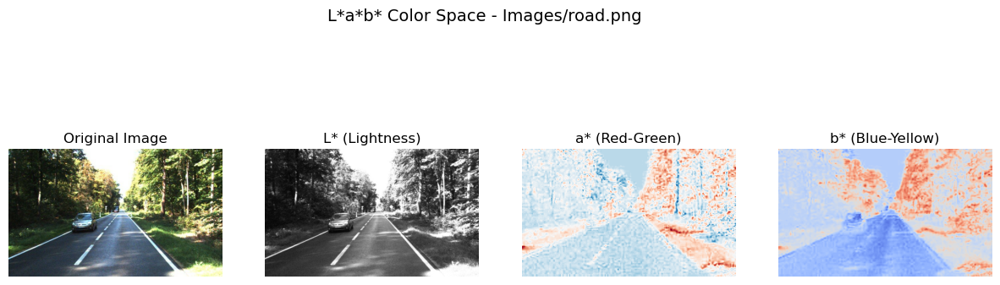

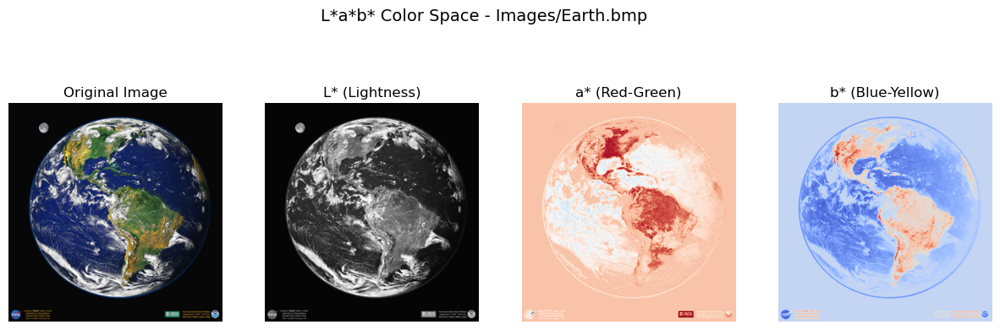

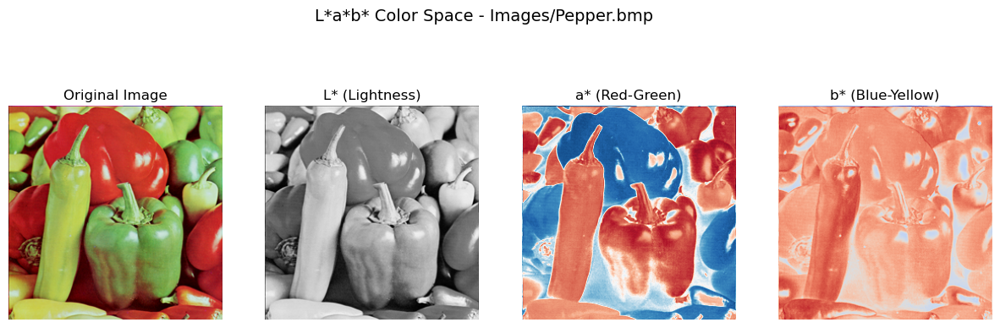

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of images to process
image_files = ["Images/road.png", "Images/Earth.bmp", "Images/Pepper.bmp"]

def display_lab_channels(image, image_name):
    """Convert image to L*a*b* and display each channel separately."""
    # Convert to L*a*b* color space
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    # Split L*, a*, and b* channels
    L, a, b = cv2.split(lab_image)

    # Display results
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    fig.suptitle(f"L*a*b* Color Space - {image_name}", fontsize=14)

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")

    axes[1].imshow(L, cmap="gray")
    axes[1].set_title("L* (Lightness)")

    axes[2].imshow(a, cmap="RdBu")
    axes[2].set_title("a* (Red-Green)")

    axes[3].imshow(b, cmap="coolwarm")
    axes[3].set_title("b* (Blue-Yellow)")

    for ax in axes:
        ax.axis("off")

    plt.show()

# Process images
for image_file in image_files:
    image = cv2.imread(image_file)
    if image is None:
        print(f"Error: Unable to load {image_file}")
        continue
    
    display_lab_channels(image, image_file)


#### **T 3.2. Increase Decrease the Lightness**

1. Convert the image `road.png` to L\*a*b.
2. Increase the L* channel (Lightness) by 1.5x, making sure values don’t exceed 255. Decrease the L* channel (Lightness) by 1.5/, making sure values don’t exceed 255.
3. Convert back to RGB and display.
4. Try diffrent values. What do you notice?

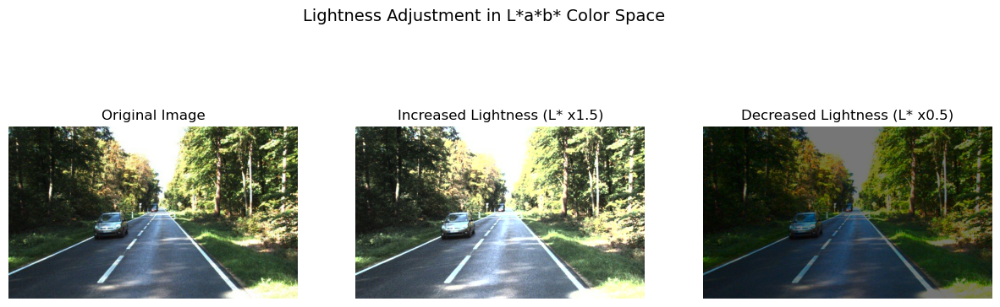

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_file = "Images/road.png"
image = cv2.imread(image_file)

if image is None:
    print(f"Error: Unable to load {image_file}")
else:
    # Convert to L*a*b* color space
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    # Split L*, a*, and b* channels
    L, a, b = cv2.split(lab_image)

    # Modify L* channel
    L_increase = np.clip(L * 1.5, 0, 255).astype(np.uint8)  # Increase brightness
    L_decrease = np.clip(L * 0.5, 0, 255).astype(np.uint8)  # Decrease brightness

    # Merge modified channels back
    increased_lab = cv2.merge([L_increase, a, b])
    decreased_lab = cv2.merge([L_decrease, a, b])

    # Convert back to RGB
    increased_rgb = cv2.cvtColor(increased_lab, cv2.COLOR_LAB2BGR)
    decreased_rgb = cv2.cvtColor(decreased_lab, cv2.COLOR_LAB2BGR)

    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle("Lightness Adjustment in L*a*b* Color Space", fontsize=14)

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")

    axes[1].imshow(cv2.cvtColor(increased_rgb, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Increased Lightness (L* x1.5)")

    axes[2].imshow(cv2.cvtColor(decreased_rgb, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Decreased Lightness (L* x0.5)")

    for ax in axes:
        ax.axis("off")

    plt.show()


**Add your analysis and comments here**

# **Lightness Adjustment in L*a*b* - Results Analysis**

## **1. Observations**
- The **Original Image** maintains natural contrast and color balance.
- **Increased Lightness (L* x1.5)**:
  - The image appears **brighter and more illuminated**.
  - Shadows are reduced, and details in darker areas become more visible.
  - Some **loss of detail in the brightest regions** (overexposed areas).
- **Decreased Lightness (L* x0.5)**:
  - The image becomes **significantly darker**.
  - Shadows are more pronounced, increasing contrast.
  - Details in **dark regions are lost**, but the colors remain accurate.


#### **T 3.3.Modify the** a* and b* **Channels to Change the Image’s Color Tint**

**Instructions**

1. Convert the image `road.png` to L\*a*b.
2. Reduce the a* channel (Red-Green) to shift the image toward green.
3. Increase the b* channel (Blue-Yellow) to add a yellow tint.
4. Convert back to RGB and display
5. Try diffrent combinations. What do you notice?*italicized text*

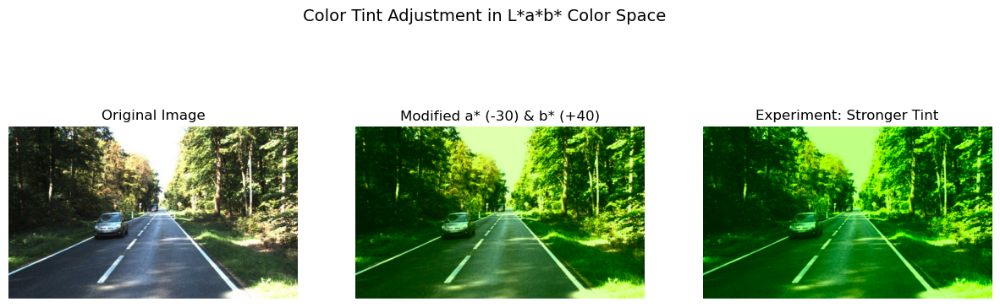

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_file = "Images/road.png"
image = cv2.imread(image_file)

if image is None:
    print(f"Error: Unable to load {image_file}")
else:
    # Convert to L*a*b* color space
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    # Split L*, a*, and b* channels
    L, a, b = cv2.split(lab_image)

    # Modify color channels
    a_modified = np.clip(a - 30, 0, 255).astype(np.uint8)  # Reduce a* to shift towards green
    b_modified = np.clip(b + 40, 0, 255).astype(np.uint8)  # Increase b* to add a yellow tint

    # Merge modified channels back
    modified_lab = cv2.merge([L, a_modified, b_modified])

    # Convert back to RGB
    modified_rgb = cv2.cvtColor(modified_lab, cv2.COLOR_LAB2BGR)

    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle("Color Tint Adjustment in L*a*b* Color Space", fontsize=14)

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")

    axes[1].imshow(cv2.cvtColor(modified_rgb, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Modified a* (-30) & b* (+40)")

    # Experiment with different values
    a_experiment = np.clip(a - 50, 0, 255).astype(np.uint8)  # More green shift
    b_experiment = np.clip(b + 60, 0, 255).astype(np.uint8)  # Stronger yellow tint
    experiment_lab = cv2.merge([L, a_experiment, b_experiment])
    experiment_rgb = cv2.cvtColor(experiment_lab, cv2.COLOR_LAB2BGR)

    axes[2].imshow(cv2.cvtColor(experiment_rgb, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Experiment: Stronger Tint")

    for ax in axes:
        ax.axis("off")

    plt.show()


**Add your analysis and comments here**

# **Color Tint Adjustment in L*a*b* - Results Analysis**

## **1. Observations**
- The **Original Image** maintains natural color balance.
- **Modified a* (-30) & b* (+40):**
  - The image has a **noticeable greenish-yellow tint**.
  - Red tones are reduced, shifting the overall color towards green.
  - The yellow enhancement makes vegetation appear more vibrant.
- **Stronger Tint Experiment (a* -50, b* +60):**
  - The image appears **overwhelmingly greenish-yellow**.
  - The **loss of red balance** makes the colors unnatural.
  - The effect is too strong, impacting visual realism.



## Task 4: HSV Color Space

The HSV (Hue, Saturation, Value) represents colors in a way that's often more intuitive for human perception compared to the standard RGB model. *Hue (H)*
represents the type of color and is typically measured in degrees *(from 0° to 360°*). *Saturation (S)* measures the intensity or purity of the color i.e., saturation of 0 means the color is completely unsaturated (a shade of gray), while a saturation of 100% (or 1, depending on the scale) means the color is fully vibrant.Value (V) indicates the brightness of the color. A value of *0* means the color is completely dark (black), and a high value indicates a brighter, more illuminated color.

**RGB to HSV Conversion Equations**

Given an RGB color with components \( R \), \( G \), and \( B \) (ranging from 0 to 255), first normalize them to the range [0,1] :


r = R / 255;   g = G / 255 ; b = B / 255

**Step 1: Calculate Value (V)**


V = max(r, g, b)


**Step 2: Find the Minimum and Delta**

Δ = V - min(r, g, b)


**Step 3: Calculate Saturation (S)**

\begin{cases}
S = 0, & \text{if } V = 0, \\
S = \dfrac{\Delta}{V}, & \text{otherwise}.
\end{cases}



**Step 4: Calculate Hue (H)**


\begin{cases}

H = 0^\circ + 60^\circ \times \left(\dfrac{g - b}{\Delta} \right), & \text{if } V = r, \\
H = 120^\circ + 60^\circ \times \left(\dfrac{b - r}{\Delta} \right), & \text{if } V = g, \\
H = 240^\circ + 60^\circ \times \left(\dfrac{r - g}{\Delta} \right), & \text{if } V = b.
\end{cases}




#### **T 4.1. Manipulate the Image Value**

**Instructions:**

1. Convert  `"road.png", "Earth.bmp" , and "Pepper.bmp"` from RGB to HSV.
 * Rebuid the function
 * Use OpenCV predefined function `cv2.COLOR_RGB2HSV`.
 * Compare the results. What do you notice.
2. Increase the Value (V) channel by a factor (e.g., 1.8), ensuring values do not exceed their maximum allowable range.
3. Experiment with different scaling factors and observe how the brightness changes.
4. What happens when the factor is too high?
5. Convert back to RGB and display.

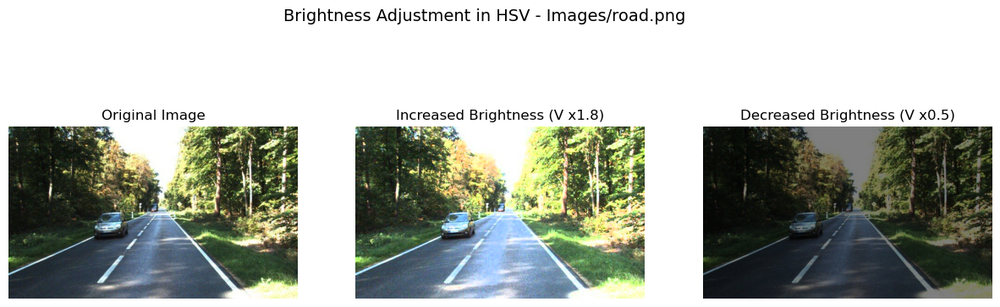

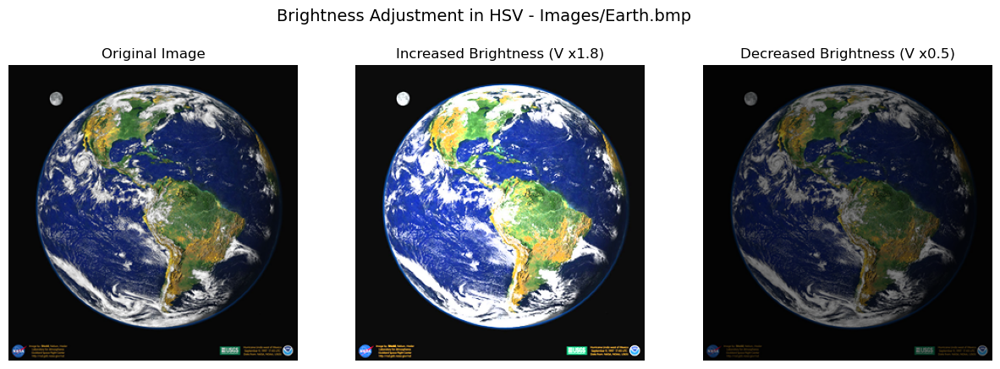

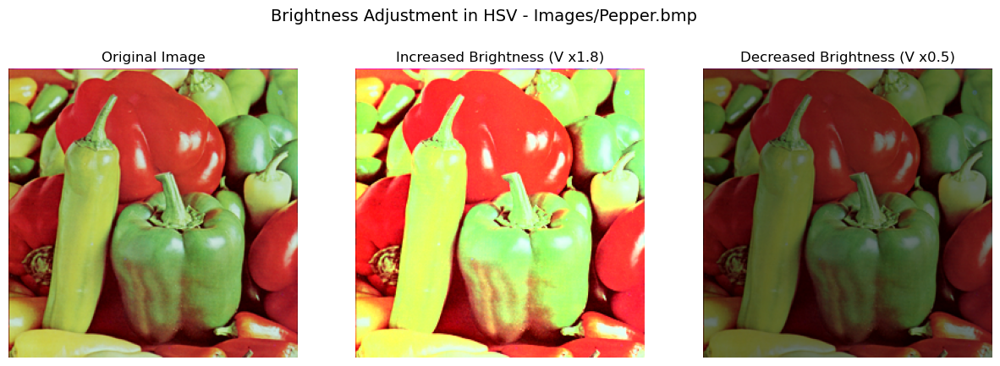

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of images to process
image_files = ["Images/road.png", "Images/Earth.bmp", "Images/Pepper.bmp"]

def adjust_brightness(image, scale_factor):
    """Convert image to HSV, adjust brightness (V channel), and convert back to RGB."""
    # Convert to HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Split HSV channels
    H, S, V = cv2.split(hsv_image)

    # Modify the V (Brightness) channel
    V_modified = np.clip(V * scale_factor, 0, 255).astype(np.uint8)

    # Merge modified channels back
    modified_hsv = cv2.merge([H, S, V_modified])

    # Convert back to RGB
    modified_rgb = cv2.cvtColor(modified_hsv, cv2.COLOR_HSV2BGR)

    return modified_rgb

# Process each image
for image_file in image_files:
    image = cv2.imread(image_file)
    if image is None:
        print(f"Error: Unable to load {image_file}")
        continue

    # Apply brightness modifications
    brightened = adjust_brightness(image, 1.8)  # Increase brightness
    darkened = adjust_brightness(image, 0.5)    # Decrease brightness

    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"Brightness Adjustment in HSV - {image_file}", fontsize=14)

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")

    axes[1].imshow(cv2.cvtColor(brightened, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Increased Brightness (V x1.8)")

    axes[2].imshow(cv2.cvtColor(darkened, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Decreased Brightness (V x0.5)")

    for ax in axes:
        ax.axis("off")

    plt.show()


**Add your analysis and comments here**

# **Brightness Adjustment in HSV - Results Analysis**

## **1. Observations**
- The **Original Images** maintain natural brightness and contrast.
- **Increased Brightness (V x1.8)**:
  - The images appear **brighter and more illuminated**.
  - Shadows are less pronounced, and details in dark areas become more visible.
  - Some **overexposure occurs** in already bright areas (e.g., the sky, reflections on peppers).
- **Decreased Brightness (V x0.5)**:
  - The images are **darker, with enhanced contrast**.
  - Shadows become more prominent, and certain areas lose visibility.
  - **Colors remain intact**, but overall visibility is reduced.



#### **T 4.2. Modify the Saturation**
 **Instruction**
1. Convert "road.png" "Before.png" (You can choose other images) from RGB to HSV.
2. Reduce the Saturation (S) channel by 40% to make the image appear washed out.
 * Ensure that the values do not drop below 0.
4. Convert the modified HSV image back to RGB and display the result.
5. Experiment with different values for S.
  * What do you notice when the saturation is very low or very high?

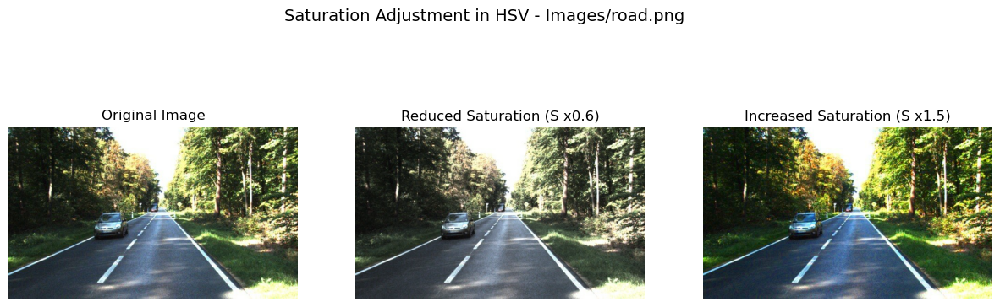

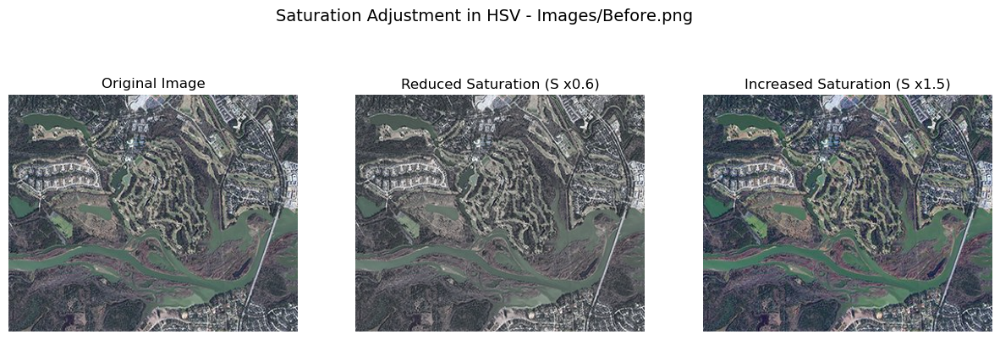

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of images to process
image_files = ["Images/road.png", "Images/Before.png"]

def adjust_saturation(image, scale_factor):
    """Convert image to HSV, modify the Saturation (S) channel, and convert back to RGB."""
    # Convert to HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Split HSV channels
    H, S, V = cv2.split(hsv_image)

    # Modify the Saturation (S) channel
    S_modified = np.clip(S * scale_factor, 0, 255).astype(np.uint8)

    # Merge modified channels back
    modified_hsv = cv2.merge([H, S_modified, V])

    # Convert back to RGB
    modified_rgb = cv2.cvtColor(modified_hsv, cv2.COLOR_HSV2BGR)

    return modified_rgb

# Process each image
for image_file in image_files:
    image = cv2.imread(image_file)
    if image is None:
        print(f"Error: Unable to load {image_file}")
        continue

    # Apply saturation modifications
    reduced_saturation = adjust_saturation(image, 0.6)  # Reduce by 40%
    increased_saturation = adjust_saturation(image, 1.5)  # Increase by 50%

    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"Saturation Adjustment in HSV - {image_file}", fontsize=14)

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")

    axes[1].imshow(cv2.cvtColor(reduced_saturation, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Reduced Saturation (S x0.6)")

    axes[2].imshow(cv2.cvtColor(increased_saturation, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Increased Saturation (S x1.5)")

    for ax in axes:
        ax.axis("off")

    plt.show()


**Add your analysis and comments here**

# **Saturation Adjustment in HSV - Results Analysis**

## **1. Observations**
- The **Original Images** have a balanced color intensity.
- **Reduced Saturation (S x0.6)**:
  - The images appear **washed out and dull**.
  - Colors lose their vibrancy, resembling a more grayscale or faded look.
  - Details remain clear, but the overall visual appeal decreases.
- **Increased Saturation (S x1.5)**:
  - The colors become **more vibrant and intense**.
  - Greens and yellows appear stronger, making the image look more vivid.
  - Excessive saturation may **cause unnatural color shifts**, especially in already colorful regions.






![Sample Image](illustrations/estimate_color.png)


## Task 5: Pixel color estimation

### **Look at the image above:**

Your task is to **recreate the pixel color inside the red square on the right using the RGB color space components:**


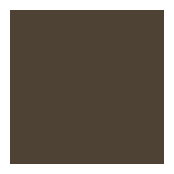

In [14]:
R = 77  # Adjust this value
G = 66  # Adjust this value
B = 52  # Adjust this value

pixel = np.zeros((100, 100, 3), dtype=np.uint8)
pixel[:, :, 0] = R
pixel[:, :, 1] = G
pixel[:, :, 2] = B


plt.figure(figsize=(2, 2))
plt.imshow(pixel)
plt.axis("off")
plt.show()


- R   = 77
- G = 66
- B  = 52

**Do the same as for RGB, but now using the HSV components (Hue, Saturation, Value) to match the pixel color inside the red square.**

- H = 17
- S = 83
- V  = 77


#### **T 5.1: Dynamic color estimation using RGB color space components**

Load an image of your choice, and do the following steps:

- Click on a pixel within the image to select a target color.
- Adjust the RGB sliders to visually match the selected color as accurately as possible.
- Click on "Check Color" to calculate and display the Mean Squared Error (MSE) between your guess and the true color.

**Note:** MSE (Mean Squared Error) measures the average squared difference between your estimation using RGB values and the correct RGB values of the pixel. Lower MSE indicates an accurate estimation.

In [16]:
pip install ipycanvas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.8/125.8 kB 987.2 kB/s eta 0:00:00a 0:00:01


Note: you may need to restart the kernel to use updated packages.


In [18]:
pip install ipycanvas ipywidgets

Note: you may need to restart the kernel to use updated packages.


In [19]:
import cv2
import numpy as np
import random
from ipycanvas import Canvas, hold_canvas
import ipywidgets as widgets
from IPython.display import display, clear_output

# ------------------------------------------------------------------------------
# 1. Load and Preprocess the Image
# ------------------------------------------------------------------------------
image_path = "Images/road.png"  # Replace with your image path

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (256, 256))
img_rgb = np.array(img)

height, width, _ = img_rgb.shape

# Convert image to RGBA for canvas rendering
img_rgba = np.zeros((height, width, 4), dtype=np.uint8)
img_rgba[..., :3] = img_rgb
img_rgba[..., 3] = 255

# ------------------------------------------------------------------------------
# 2. Create the Canvas and the "Guessed Color" Square
# ------------------------------------------------------------------------------
main_canvas = Canvas(width=width, height=height)
guess_canvas = Canvas(width=50, height=50)
main_canvas.put_image_data(img_rgba, 0, 0)

selected_color = None  
selected_coords = None  

# ------------------------------------------------------------------------------
# 3. Mouse Click Handler
# ------------------------------------------------------------------------------
def on_mouse_down(x, y):
    """Capture the selected pixel color on click."""
    x, y = int(x), int(y)
    global selected_color, selected_coords
    if 0 <= x < width and 0 <= y < height:
        selected_coords = (x, y)
        selected_color = img_rgb[y, x]

        with hold_canvas(main_canvas):
            main_canvas.clear()
            main_canvas.put_image_data(img_rgba, 0, 0)
            main_canvas.stroke_style = "red"
            main_canvas.begin_path()
            main_canvas.move_to(x - 5, y)
            main_canvas.line_to(x + 5, y)
            main_canvas.move_to(x, y - 5)
            main_canvas.line_to(x, y + 5)
            main_canvas.stroke()

        info_label.value = f"Selected pixel at ({x}, {y}). Now guess its color!"

main_canvas.on_mouse_down(on_mouse_down)

# ------------------------------------------------------------------------------
# 4. Sliders & "Check Color" Button
# ------------------------------------------------------------------------------
slider_R = widgets.IntSlider(min=0, max=255, value=0, description='R:')
slider_G = widgets.IntSlider(min=0, max=255, value=0, description='G:')
slider_B = widgets.IntSlider(min=0, max=255, value=0, description='B:')

def update_guess_canvas(_=None):
    """Update the guessed color preview."""
    guess_canvas.clear()
    guess_canvas.fill_style = f"rgb({slider_R.value}, {slider_G.value}, {slider_B.value})"
    guess_canvas.fill_rect(0, 0, 50, 50)

slider_R.observe(update_guess_canvas, 'value')
slider_G.observe(update_guess_canvas, 'value')
slider_B.observe(update_guess_canvas, 'value')
update_guess_canvas()

check_button = widgets.Button(description='Check Color')
output_result = widgets.Output()

def on_check_color_clicked(_):
    """Compute the Mean Squared Error (MSE) between guessed color and selected pixel."""
    if selected_color is None:
        info_label.value = "No pixel selected yet!"
        return

    guess_color = np.array([slider_R.value, slider_G.value, slider_B.value], dtype=np.uint8)
    mse = np.mean((selected_color.astype(np.float32) - guess_color.astype(np.float32)) ** 2)

    with output_result:
        clear_output()
        print(f"MSE: {mse:.2f} (Lower is better!)")

check_button.on_click(on_check_color_clicked)

# ------------------------------------------------------------------------------
# 5. Layout
# ------------------------------------------------------------------------------
info_label = widgets.Label(
    "Click on the image to select a pixel. Adjust sliders to match the color, then click 'Check Color'."
)

layout = widgets.VBox([
    info_label,
    widgets.HBox([
        main_canvas,
        widgets.VBox([
            widgets.Label("Guessed color:"),
            guess_canvas
        ])
    ]),
    widgets.HBox([slider_R, slider_G, slider_B, check_button]),
    output_result
])

display(layout)
update_guess_canvas()  # Ensure guessed color is drawn immediately

# ------------------------------------------------------------------------------
# 6. Auto-select a Random Pixel on Startup
# ------------------------------------------------------------------------------
rand_x = random.randint(0, width - 1)
rand_y = random.randint(0, height - 1)
on_mouse_down(rand_x, rand_y)



### Questions

   1. Why might it be difficult to match colors precisely using RGB?
   2. How sensitive is color estimation in RGB space?



***Add your analysis and comments here***  

# **Analysis: Challenges in RGB Color Matching**

### **1. Why might it be difficult to match colors precisely using RGB?**
- **Non-Uniform Perception:** RGB values do not correspond directly to how the human eye perceives colors. Small numeric differences in RGB values can sometimes lead to large perceptual differences.
- **Color Dependency:** The appearance of a color is influenced by surrounding colors and lighting conditions, making manual RGB adjustments less intuitive.
- **Gamma Correction:** Display screens often apply gamma correction, meaning RGB values do not map linearly to perceived brightness.
- **Lack of Hue-Saturation Separation:** RGB combines all color information in three channels, making it harder to adjust colors meaningfully compared to spaces like **HSV or L*a*b***.

---

### **2. How sensitive is color estimation in RGB space?**
- **Highly Sensitive:** Small changes in RGB values can produce **noticeable shifts**, especially in certain color ranges (e.g., blues are more sensitive than reds).
- **Inconsistent Across Screens:** The same RGB values may look different on different devices due to variations in **screen calibration, brightness, and contrast settings**.
- **Limited Precision for Close Shades:** Colors that appear similar to the human eye may have **different RGB values**, making precise matching difficult without perceptual color spaces.




#### **T 5.2: Dynamic color estimation using HSV space**

- Now let's perform the same task using HSV color space (Hue, Saturation, Value).

**Note:** HSV is often considered more intuitive for color adjustments. Try to see if you can achieve a lower MSE compared to the RGB sliders!


In [23]:
import cv2
import numpy as np
import random
import colorsys
from ipycanvas import Canvas, hold_canvas
import ipywidgets as widgets
from IPython.display import display, clear_output

# ------------------------------------------------------------------------------
# 1. Load and Preprocess the Image
# ------------------------------------------------------------------------------
image_path = "Images/road.png"  # Replace with your image path

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (256, 256))
img_rgb = np.array(img)

height, width, _ = img_rgb.shape

# Convert image to RGBA for canvas rendering
display_rgba = np.zeros((height, width, 4), dtype=np.uint8)
display_rgba[..., :3] = img_rgb
display_rgba[..., 3] = 255

# ------------------------------------------------------------------------------
# 2. Create the Canvas and the "Guessed Color" Square
# ------------------------------------------------------------------------------
main_canvas = Canvas(width=width, height=height)
guess_canvas = Canvas(width=50, height=50)
main_canvas.put_image_data(display_rgba, 0, 0)

selected_color = None  
selected_coords = None  

# ------------------------------------------------------------------------------
# 3. Mouse Click Handler
# ------------------------------------------------------------------------------
def on_mouse_down(x, y):
    """Capture the selected pixel color on click."""
    x, y = int(x), int(y)
    global selected_color, selected_coords
    if 0 <= x < width and 0 <= y < height:
        selected_coords = (x, y)
        selected_color = img_rgb[y, x]

        with hold_canvas(main_canvas):
            main_canvas.clear()
            main_canvas.put_image_data(display_rgba, 0, 0)
            main_canvas.stroke_style = "red"
            main_canvas.begin_path()
            main_canvas.move_to(x - 5, y)
            main_canvas.line_to(x + 5, y)
            main_canvas.move_to(x, y - 5)
            main_canvas.line_to(x, y + 5)
            main_canvas.stroke()

        info_label.value = f"Selected pixel at ({x}, {y}). Now guess its color in HSV!"

main_canvas.on_mouse_down(on_mouse_down)

# ------------------------------------------------------------------------------
# 4. HSV Sliders & "Check Color" Button
# ------------------------------------------------------------------------------
slider_H = widgets.IntSlider(min=0, max=360, value=0, description='H:')
slider_S = widgets.IntSlider(min=0, max=100, value=0, description='S:')
slider_V = widgets.IntSlider(min=0, max=100, value=0, description='V:')

def update_guess_canvas(_=None):
    """Convert the HSV slider values to RGB and update the guessed color preview."""
    h = slider_H.value / 360.0
    s = slider_S.value / 100.0
    v = slider_V.value / 100.0
    r, g, b = colorsys.hsv_to_rgb(h, s, v)
    r_int, g_int, b_int = int(r * 255), int(g * 255), int(b * 255)
    guess_canvas.clear()
    guess_canvas.fill_style = f"rgb({r_int}, {g_int}, {b_int})"
    guess_canvas.fill_rect(0, 0, 50, 50)

slider_H.observe(update_guess_canvas, 'value')
slider_S.observe(update_guess_canvas, 'value')
slider_V.observe(update_guess_canvas, 'value')
update_guess_canvas()

check_button = widgets.Button(description='Check Color')
output_result = widgets.Output()

def on_check_color_clicked(_):
    """Convert the HSV guess to RGB and compute the MSE with the true RGB color."""
    if selected_color is None:
        info_label.value = "No pixel selected yet!"
        return
    h = slider_H.value / 360.0
    s = slider_S.value / 100.0
    v = slider_V.value / 100.0
    r, g, b = colorsys.hsv_to_rgb(h, s, v)
    guess_color = np.array([int(r * 255), int(g * 255), int(b * 255)], dtype=np.uint8)
    mse = np.mean((selected_color.astype(np.float32) - guess_color.astype(np.float32)) ** 2)

    with output_result:
        clear_output()
        print(f"MSE: {mse:.2f} (Lower is better!)")

check_button.on_click(on_check_color_clicked)

# ------------------------------------------------------------------------------
# 5. Layout
# ------------------------------------------------------------------------------
info_label = widgets.Label(
    "Click on the image to select a pixel. Adjust the HSV sliders to guess its color, then click 'Check Color'."
)

layout = widgets.VBox([
    info_label,
    widgets.HBox([
        main_canvas,
        widgets.VBox([
            widgets.Label("Guessed color:"),
            guess_canvas
        ])
    ]),
    widgets.HBox([slider_H, slider_S, slider_V, check_button]),
    output_result
])

display(layout)
update_guess_canvas()

# ------------------------------------------------------------------------------
# 6. Auto-select a Random Pixel on Startup
# ------------------------------------------------------------------------------
rand_x = random.randint(0, width - 1)
rand_y = random.randint(0, height - 1)
on_mouse_down(rand_x, rand_y)


### Question :

How does the HSV model compare to RGB in terms of intuitiveness when selecting colors?

# **HSV vs RGB: Intuitiveness in Color Selection**

## **Understanding the Difference**
- **RGB (Red, Green, Blue):** Represents colors as a mix of three primary light components. It is useful for digital displays but **not intuitive** for manual color adjustments.
- **HSV (Hue, Saturation, Value):** Separates color into **hue (color type), saturation (color intensity), and value (brightness)**, making it **easier to manipulate visually**.

## Comparing RGB vs HSV in Color Selection
| Feature  | RGB | HSV |
|----------|-----|-----|
| **Color Control** | Requires adjusting three values (R, G, B) together | Adjusting Hue (H) directly changes color |
| **Brightness Control** | Needs proportional R, G, B changes | Controlled separately with Value (V) |
| **Saturation Control** | Hard to tweak without affecting brightness | Independent via Saturation (S) |
| **Ease of Use** | Less intuitive for human perception | More intuitive and human-friendly |




#### **T 5.3: Estimate a color based on your perception**

Try to estimate the pixel color from an image displayed through the projector. You need to estimate that color using both color spaces RGB and HSV:

RGB space :
- R = 120
- G = 180
- B = 255

HSV space :
- H = 210
- S = 53%
- V = 100%



## Optional Task:

The **RGB color space** is not **perceptually uniform**, meaning that colors that appear **visually similar** may have **very different numerical values** (a large Euclidian distance between thir pixels), and vice-versa. This non-linearity can lead to unexpected results when calculating differences between colors.

You have to do the following steps:

1. Find at least three examples where two colors that appear **very similar** to the human eye have a **large distance**.
2. Find another three examples where two colors that appear **very different** have a **small distance**.
3. Explain why this happens by considering **human color perception** versus **numerical differences in RGB space**.


# **Optional Task: RGB Color Space & Perceptual Non-Uniformity**

## **1. Examples Where Visually Similar Colors Have a Large Distance**
These colors **look almost identical** to the human eye but have **large numerical distances** in RGB.

### **Example 1: Light Sky Blue vs. Powder Blue**
- **Light Sky Blue (135, 206, 250)**
- **Powder Blue (176, 224, 230)**
- **Euclidean Distance in RGB:** **52.34**
- **Perceptual Difference:** Minimal; both appear as soft blue shades.

### **Example 2: Soft Pink vs. Light Salmon**
- **Soft Pink (255, 182, 193)**
- **Light Salmon (255, 160, 122)**
- **Euclidean Distance in RGB:** **65.23**
- **Perceptual Difference:** Almost identical; both are warm pinkish shades.

### **Example 3: Forest Green vs. Dark Sea Green**
- **Forest Green (34, 139, 34)**
- **Dark Sea Green (143, 188, 143)**
- **Euclidean Distance in RGB:** **87.63**
- **Perceptual Difference:** Both appear green but with minor brightness variation.

---

## **2. Examples Where Visually Different Colors Have a Small Distance**
These colors **look completely different** but have **small RGB distances**.

### **Example 4: Yellow vs. Light Orange**
- **Yellow (255, 255, 0)**
- **Light Orange (255, 200, 50)**
- **Euclidean Distance in RGB:** **55.9**
- **Perceptual Difference:** Huge! Yellow looks bright, while orange has a strong warm tint.

### **Example 5: Deep Purple vs. Navy Blue**
- **Deep Purple (75, 0, 130)**
- **Navy Blue (0, 0, 128)**
- **Euclidean Distance in RGB:** **76.16**
- **Perceptual Difference:** Purple vs. Blue! These colors look **entirely different** to the human eye.

### **Example 6: Bright Cyan vs. Light Gray**
- **Bright Cyan (0, 255, 255)**
- **Light Gray (192, 192, 192)**
- **Euclidean Distance in RGB:** **77.83**
- **Perceptual Difference:** Cyan is a **strong, vibrant color**, while gray is **neutral and dull**.

---

## **3. Why Does This Happen?**
**Human Perception is Non-Linear:**  
- The human eye **perceives brightness and contrast differently than RGB values suggest**.  
- Small changes in **green shades** appear larger than the same change in **blue shades**.  

**RGB Doesn't Reflect How We See Colors:**  
- RGB **measures absolute color values**, but the human eye **processes colors based on surrounding contrasts and brightness**.  
- This is why **Lab (L\*a\*b\*) or HSV spaces** are better for color perception tasks.

**Color Sensitivity Varies for Different Wavelengths:**  
- **Green is more sensitive** to small changes than **red or blue**.  
- **Dark colors are harder to distinguish** than bright ones, even if they have **big RGB differences**.

---

